# Check the Python version being used

In [1]:
!python --version

Python 3.7.6


# Check that the available gpu is being utilized

In [2]:
import tensorflow as tf

In [3]:
print("Num GPUs Available")
print(len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available
1


# Start of second method of time series forecasting (cnn) without any normalization and with minimum bridge data

In [4]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [5]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [6]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [7]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [8]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [9]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [10]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [11]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [12]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [13]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [14]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 6)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 6)
Shape of test_y: (222,)


# Must split multivariate time series into individual univariate time series to be fed into each channel in the model

In [15]:
train_X1 = []
train_X2 = []
train_X3 = []
train_X4 = []
train_X5 = []
train_X6 = []

for i in train_X:
    train_X1.append([x[0] for x in i])
    train_X2.append([x[1] for x in i])
    train_X3.append([x[2] for x in i])
    train_X4.append([x[3] for x in i])
    train_X5.append([x[4] for x in i])
    train_X6.append([x[5] for x in i])

In [16]:
np.array(train_X2).shape

train_X1 = np.array(train_X1)
train_X2 = np.array(train_X2)
train_X3 = np.array(train_X3)
train_X4 = np.array(train_X4)
train_X5 = np.array(train_X5)
train_X6 = np.array(train_X6)

In [17]:
test_X1 = []
test_X2 = []
test_X3 = []
test_X4 = []
test_X5 = []
test_X6 = []

for i in test_X:
    test_X1.append([x[0] for x in i])
    test_X2.append([x[1] for x in i])
    test_X3.append([x[2] for x in i])
    test_X4.append([x[3] for x in i])
    test_X5.append([x[4] for x in i])
    test_X6.append([x[5] for x in i])

In [18]:
np.array(train_X2).shape

test_X1 = np.array(test_X1)
test_X2 = np.array(test_X2)
test_X3 = np.array(test_X3)
test_X4 = np.array(test_X4)
test_X5 = np.array(test_X5)
test_X6 = np.array(test_X6)

# Build multi-channel cnn model

In [19]:
### Build a channel for each of the 6 variables

# channel 1
inputs1 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv1 = tf.keras.layers.Conv1D(filters=8, kernel_size=5, activation='relu')(inputs1)
drop1 = tf.keras.layers.Dropout(0.5)(conv1)
pool1 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1)
conv1_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool1)
drop1_2 = tf.keras.layers.Dropout(0.5)(conv1_2)
pool1_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1_2)
flat1 = tf.keras.layers.Flatten()(pool1_2)

# channel 2
inputs2 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv2 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs2)
drop2 = tf.keras.layers.Dropout(0.5)(conv2)
pool2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2)
conv2_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool2)
drop2_2 = tf.keras.layers.Dropout(0.5)(conv2_2)
pool2_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2_2)
flat2 = tf.keras.layers.Flatten()(pool2_2)

# channel 3
inputs3 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv3 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs3)
drop3 = tf.keras.layers.Dropout(0.5)(conv3)
pool3 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3)
conv3_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool3)
drop3_2 = tf.keras.layers.Dropout(0.5)(conv3_2)
pool3_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3_2)
flat3 = tf.keras.layers.Flatten()(pool3_2)

# channel 4
inputs4 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv4 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs4)
drop4 = tf.keras.layers.Dropout(0.5)(conv4)
pool4 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4)
conv4_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool4)
drop4_2 = tf.keras.layers.Dropout(0.5)(conv4_2)
pool4_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4_2)
flat4 = tf.keras.layers.Flatten()(pool4_2)

# channel 5
inputs5 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv5 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs5)
drop5 = tf.keras.layers.Dropout(0.5)(conv5)
pool5 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5)
conv5_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool5)
drop5_2 = tf.keras.layers.Dropout(0.5)(conv5_2)
pool5_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5_2)
flat5 = tf.keras.layers.Flatten()(pool5_2)

# channel 6
inputs6 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv6 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs6)
drop6 = tf.keras.layers.Dropout(0.5)(conv6)
pool6 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6)
conv6_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool6)
drop6_2 = tf.keras.layers.Dropout(0.5)(conv6_2)
pool6_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6_2)
flat6 = tf.keras.layers.Flatten()(pool6_2)

# merge
merged = tf.keras.layers.concatenate([flat1, flat2, flat3, flat4, flat5, flat6])

# dense output layers
dense1 = tf.keras.layers.Dense(units=732, activation='relu')(merged)
output = tf.keras.layers.Dense(units=1)(dense1)

multi_channel_cnn_model = tf.keras.Model(inputs=[inputs1, inputs2, inputs3, inputs4, inputs5, inputs6], outputs=output)

print(multi_channel_cnn_model.summary())

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 21, 1)]      0                                            
_______________________________________________________________________________________

# Compile model

In [20]:
from tensorflow import keras

multi_channel_cnn_model.compile(loss='mae', optimizer='adam')

# Train model

In [21]:
history = multi_channel_cnn_model.fit([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6], train_y, epochs=2000, batch_size=32, 
                                      validation_data=([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6], test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 0s - loss: 99.4815 - val_loss: 49.2899
Epoch 2/2000
10/10 - 0s - loss: 38.9283 - val_loss: 56.6793
Epoch 3/2000
10/10 - 0s - loss: 31.6414 - val_loss: 44.9334
Epoch 4/2000
10/10 - 0s - loss: 20.1103 - val_loss: 43.7834
Epoch 5/2000
10/10 - 0s - loss: 23.4311 - val_loss: 48.7030
Epoch 6/2000
10/10 - 0s - loss: 16.6961 - val_loss: 46.4915
Epoch 7/2000
10/10 - 0s - loss: 17.4165 - val_loss: 48.0353
Epoch 8/2000
10/10 - 0s - loss: 16.3439 - val_loss: 49.0160
Epoch 9/2000
10/10 - 0s - loss: 14.6987 - val_loss: 49.5221
Epoch 10/2000
10/10 - 0s - loss: 15.2017 - val_loss: 46.5338
Epoch 11/2000
10/10 - 0s - loss: 14.4787 - val_loss: 47.1415
Epoch 12/2000
10/10 - 0s - loss: 14.7076 - val_loss: 50.1209
Epoch 13/2000
10/10 - 0s - loss: 11.5047 - val_loss: 51.1415
Epoch 14/2000
10/10 - 0s - loss: 12.1436 - val_loss: 50.5612
Epoch 15/2000
10/10 - 0s - loss: 10.1500 - val_loss: 50.8487
Epoch 16/2000
10/10 - 0s - loss: 10.1031 - val_loss: 50.0080
Epoch 17/2000
10/10 - 0s - loss: 

Epoch 137/2000
10/10 - 0s - loss: 7.4015 - val_loss: 47.7804
Epoch 138/2000
10/10 - 0s - loss: 8.5979 - val_loss: 50.2456
Epoch 139/2000
10/10 - 0s - loss: 7.1136 - val_loss: 50.7900
Epoch 140/2000
10/10 - 0s - loss: 6.6133 - val_loss: 51.1794
Epoch 141/2000
10/10 - 0s - loss: 6.5771 - val_loss: 51.4320
Epoch 142/2000
10/10 - 0s - loss: 6.9115 - val_loss: 50.9716
Epoch 143/2000
10/10 - 0s - loss: 6.5899 - val_loss: 50.8375
Epoch 144/2000
10/10 - 0s - loss: 6.4119 - val_loss: 50.8524
Epoch 145/2000
10/10 - 0s - loss: 6.5902 - val_loss: 50.5813
Epoch 146/2000
10/10 - 0s - loss: 5.8126 - val_loss: 50.5016
Epoch 147/2000
10/10 - 0s - loss: 7.1410 - val_loss: 50.3161
Epoch 148/2000
10/10 - 0s - loss: 6.7215 - val_loss: 50.8392
Epoch 149/2000
10/10 - 0s - loss: 7.1036 - val_loss: 49.8068
Epoch 150/2000
10/10 - 0s - loss: 6.9983 - val_loss: 49.4744
Epoch 151/2000
10/10 - 0s - loss: 8.1633 - val_loss: 47.9299
Epoch 152/2000
10/10 - 0s - loss: 8.1806 - val_loss: 47.9737
Epoch 153/2000
10/10 - 0

Epoch 272/2000
10/10 - 0s - loss: 6.1019 - val_loss: 49.2116
Epoch 273/2000
10/10 - 0s - loss: 6.0984 - val_loss: 49.7046
Epoch 274/2000
10/10 - 0s - loss: 6.1229 - val_loss: 49.6902
Epoch 275/2000
10/10 - 0s - loss: 6.1718 - val_loss: 48.9446
Epoch 276/2000
10/10 - 0s - loss: 6.0736 - val_loss: 49.2722
Epoch 277/2000
10/10 - 0s - loss: 6.7299 - val_loss: 48.4891
Epoch 278/2000
10/10 - 0s - loss: 6.7906 - val_loss: 48.1306
Epoch 279/2000
10/10 - 0s - loss: 6.9705 - val_loss: 49.8614
Epoch 280/2000
10/10 - 0s - loss: 6.1333 - val_loss: 49.8786
Epoch 281/2000
10/10 - 0s - loss: 5.3551 - val_loss: 50.1003
Epoch 282/2000
10/10 - 0s - loss: 5.7361 - val_loss: 50.1671
Epoch 283/2000
10/10 - 0s - loss: 5.6737 - val_loss: 50.3206
Epoch 284/2000
10/10 - 0s - loss: 6.2136 - val_loss: 50.4580
Epoch 285/2000
10/10 - 0s - loss: 6.4041 - val_loss: 49.7355
Epoch 286/2000
10/10 - 0s - loss: 5.5530 - val_loss: 50.0714
Epoch 287/2000
10/10 - 0s - loss: 6.0742 - val_loss: 49.9274
Epoch 288/2000
10/10 - 0

Epoch 407/2000
10/10 - 0s - loss: 5.8169 - val_loss: 49.2817
Epoch 408/2000
10/10 - 0s - loss: 5.8494 - val_loss: 48.9893
Epoch 409/2000
10/10 - 0s - loss: 6.1428 - val_loss: 48.3087
Epoch 410/2000
10/10 - 0s - loss: 6.1407 - val_loss: 48.8415
Epoch 411/2000
10/10 - 0s - loss: 5.6403 - val_loss: 49.0516
Epoch 412/2000
10/10 - 0s - loss: 6.0918 - val_loss: 49.3475
Epoch 413/2000
10/10 - 0s - loss: 5.8378 - val_loss: 48.6889
Epoch 414/2000
10/10 - 0s - loss: 6.2635 - val_loss: 48.3967
Epoch 415/2000
10/10 - 0s - loss: 6.2681 - val_loss: 49.4831
Epoch 416/2000
10/10 - 0s - loss: 5.5811 - val_loss: 50.1042
Epoch 417/2000
10/10 - 0s - loss: 5.9644 - val_loss: 49.8097
Epoch 418/2000
10/10 - 0s - loss: 5.1283 - val_loss: 49.9670
Epoch 419/2000
10/10 - 0s - loss: 5.4174 - val_loss: 49.5769
Epoch 420/2000
10/10 - 0s - loss: 5.5392 - val_loss: 49.4422
Epoch 421/2000
10/10 - 0s - loss: 5.5977 - val_loss: 49.6241
Epoch 422/2000
10/10 - 0s - loss: 5.6707 - val_loss: 49.0985
Epoch 423/2000
10/10 - 0

Epoch 542/2000
10/10 - 0s - loss: 6.3201 - val_loss: 50.4029
Epoch 543/2000
10/10 - 0s - loss: 5.9677 - val_loss: 50.3453
Epoch 544/2000
10/10 - 0s - loss: 5.2242 - val_loss: 50.5369
Epoch 545/2000
10/10 - 0s - loss: 5.5721 - val_loss: 50.7060
Epoch 546/2000
10/10 - 0s - loss: 5.4804 - val_loss: 50.4739
Epoch 547/2000
10/10 - 0s - loss: 5.6558 - val_loss: 50.6543
Epoch 548/2000
10/10 - 0s - loss: 5.4311 - val_loss: 51.0340
Epoch 549/2000
10/10 - 0s - loss: 5.4035 - val_loss: 51.4650
Epoch 550/2000
10/10 - 0s - loss: 5.4353 - val_loss: 51.5975
Epoch 551/2000
10/10 - 0s - loss: 5.5336 - val_loss: 50.6303
Epoch 552/2000
10/10 - 0s - loss: 6.0227 - val_loss: 50.0589
Epoch 553/2000
10/10 - 0s - loss: 6.2689 - val_loss: 50.1676
Epoch 554/2000
10/10 - 0s - loss: 5.5195 - val_loss: 50.5132
Epoch 555/2000
10/10 - 0s - loss: 5.0980 - val_loss: 51.3452
Epoch 556/2000
10/10 - 0s - loss: 5.1395 - val_loss: 50.7901
Epoch 557/2000
10/10 - 0s - loss: 5.5278 - val_loss: 50.7638
Epoch 558/2000
10/10 - 0

Epoch 677/2000
10/10 - 0s - loss: 5.4133 - val_loss: 61.4218
Epoch 678/2000
10/10 - 0s - loss: 4.9524 - val_loss: 60.4824
Epoch 679/2000
10/10 - 0s - loss: 5.5258 - val_loss: 58.9983
Epoch 680/2000
10/10 - 0s - loss: 5.9472 - val_loss: 55.0713
Epoch 681/2000
10/10 - 0s - loss: 5.2533 - val_loss: 54.3459
Epoch 682/2000
10/10 - 0s - loss: 4.6509 - val_loss: 53.1035
Epoch 683/2000
10/10 - 0s - loss: 5.2054 - val_loss: 51.7188
Epoch 684/2000
10/10 - 0s - loss: 5.4426 - val_loss: 52.2832
Epoch 685/2000
10/10 - 0s - loss: 5.4530 - val_loss: 53.1910
Epoch 686/2000
10/10 - 0s - loss: 5.3551 - val_loss: 53.5620
Epoch 687/2000
10/10 - 0s - loss: 5.4630 - val_loss: 52.2528
Epoch 688/2000
10/10 - 0s - loss: 5.2164 - val_loss: 51.2928
Epoch 689/2000
10/10 - 0s - loss: 5.2169 - val_loss: 51.2823
Epoch 690/2000
10/10 - 0s - loss: 5.3990 - val_loss: 51.4121
Epoch 691/2000
10/10 - 0s - loss: 5.8895 - val_loss: 50.6330
Epoch 692/2000
10/10 - 0s - loss: 5.3865 - val_loss: 50.8651
Epoch 693/2000
10/10 - 0

Epoch 812/2000
10/10 - 0s - loss: 5.8025 - val_loss: 52.8403
Epoch 813/2000
10/10 - 0s - loss: 5.3947 - val_loss: 53.5242
Epoch 814/2000
10/10 - 0s - loss: 5.2186 - val_loss: 54.4179
Epoch 815/2000
10/10 - 0s - loss: 5.1703 - val_loss: 56.4332
Epoch 816/2000
10/10 - 0s - loss: 5.3433 - val_loss: 58.6956
Epoch 817/2000
10/10 - 0s - loss: 5.5689 - val_loss: 67.0017
Epoch 818/2000
10/10 - 0s - loss: 5.3614 - val_loss: 64.3140
Epoch 819/2000
10/10 - 0s - loss: 5.4144 - val_loss: 67.0386
Epoch 820/2000
10/10 - 0s - loss: 5.3907 - val_loss: 69.4645
Epoch 821/2000
10/10 - 0s - loss: 4.9713 - val_loss: 75.6390
Epoch 822/2000
10/10 - 0s - loss: 5.1163 - val_loss: 77.6119
Epoch 823/2000
10/10 - 0s - loss: 6.1658 - val_loss: 53.9016
Epoch 824/2000
10/10 - 0s - loss: 5.4446 - val_loss: 51.6485
Epoch 825/2000
10/10 - 0s - loss: 5.2334 - val_loss: 50.2433
Epoch 826/2000
10/10 - 0s - loss: 5.3211 - val_loss: 50.3095
Epoch 827/2000
10/10 - 0s - loss: 4.8486 - val_loss: 50.7301
Epoch 828/2000
10/10 - 0

Epoch 947/2000
10/10 - 0s - loss: 4.9754 - val_loss: 54.8408
Epoch 948/2000
10/10 - 0s - loss: 5.8487 - val_loss: 55.1351
Epoch 949/2000
10/10 - 0s - loss: 5.9808 - val_loss: 56.1397
Epoch 950/2000
10/10 - 0s - loss: 5.3471 - val_loss: 55.4771
Epoch 951/2000
10/10 - 0s - loss: 5.1946 - val_loss: 54.8176
Epoch 952/2000
10/10 - 0s - loss: 5.3619 - val_loss: 54.5096
Epoch 953/2000
10/10 - 0s - loss: 4.9651 - val_loss: 54.8516
Epoch 954/2000
10/10 - 0s - loss: 5.1841 - val_loss: 53.6772
Epoch 955/2000
10/10 - 0s - loss: 5.4669 - val_loss: 51.3258
Epoch 956/2000
10/10 - 0s - loss: 5.6838 - val_loss: 50.3384
Epoch 957/2000
10/10 - 0s - loss: 5.0536 - val_loss: 50.1019
Epoch 958/2000
10/10 - 0s - loss: 5.1190 - val_loss: 50.8968
Epoch 959/2000
10/10 - 0s - loss: 5.5671 - val_loss: 51.1871
Epoch 960/2000
10/10 - 0s - loss: 5.9240 - val_loss: 51.9378
Epoch 961/2000
10/10 - 0s - loss: 5.8171 - val_loss: 51.9525
Epoch 962/2000
10/10 - 0s - loss: 5.8354 - val_loss: 51.1405
Epoch 963/2000
10/10 - 0

Epoch 1080/2000
10/10 - 0s - loss: 5.1036 - val_loss: 64.4618
Epoch 1081/2000
10/10 - 0s - loss: 5.2757 - val_loss: 60.5994
Epoch 1082/2000
10/10 - 0s - loss: 5.3773 - val_loss: 62.0172
Epoch 1083/2000
10/10 - 0s - loss: 5.6166 - val_loss: 61.6035
Epoch 1084/2000
10/10 - 0s - loss: 5.1913 - val_loss: 64.8837
Epoch 1085/2000
10/10 - 0s - loss: 5.2694 - val_loss: 68.5372
Epoch 1086/2000
10/10 - 0s - loss: 5.1878 - val_loss: 67.1431
Epoch 1087/2000
10/10 - 0s - loss: 5.1436 - val_loss: 59.9905
Epoch 1088/2000
10/10 - 0s - loss: 4.8967 - val_loss: 58.2579
Epoch 1089/2000
10/10 - 0s - loss: 5.2212 - val_loss: 59.8740
Epoch 1090/2000
10/10 - 0s - loss: 5.0578 - val_loss: 62.0257
Epoch 1091/2000
10/10 - 0s - loss: 4.8206 - val_loss: 59.6762
Epoch 1092/2000
10/10 - 0s - loss: 6.0062 - val_loss: 59.8690
Epoch 1093/2000
10/10 - 0s - loss: 5.4616 - val_loss: 60.2925
Epoch 1094/2000
10/10 - 0s - loss: 5.5389 - val_loss: 58.8203
Epoch 1095/2000
10/10 - 0s - loss: 5.9521 - val_loss: 59.8093
Epoch 10

Epoch 1212/2000
10/10 - 0s - loss: 4.8896 - val_loss: 70.6714
Epoch 1213/2000
10/10 - 0s - loss: 5.0091 - val_loss: 77.6699
Epoch 1214/2000
10/10 - 0s - loss: 5.1359 - val_loss: 85.7823
Epoch 1215/2000
10/10 - 0s - loss: 4.9626 - val_loss: 89.9703
Epoch 1216/2000
10/10 - 0s - loss: 5.1822 - val_loss: 103.1888
Epoch 1217/2000
10/10 - 0s - loss: 4.9275 - val_loss: 122.3609
Epoch 1218/2000
10/10 - 0s - loss: 5.7980 - val_loss: 134.8594
Epoch 1219/2000
10/10 - 0s - loss: 5.5258 - val_loss: 143.9117
Epoch 1220/2000
10/10 - 0s - loss: 5.2573 - val_loss: 150.9196
Epoch 1221/2000
10/10 - 0s - loss: 5.0372 - val_loss: 159.9946
Epoch 1222/2000
10/10 - 0s - loss: 4.9125 - val_loss: 195.0605
Epoch 1223/2000
10/10 - 0s - loss: 4.9893 - val_loss: 157.5553
Epoch 1224/2000
10/10 - 0s - loss: 5.0618 - val_loss: 94.5172
Epoch 1225/2000
10/10 - 0s - loss: 5.4790 - val_loss: 81.6501
Epoch 1226/2000
10/10 - 0s - loss: 5.3849 - val_loss: 62.2746
Epoch 1227/2000
10/10 - 0s - loss: 4.8585 - val_loss: 53.3938


Epoch 1344/2000
10/10 - 0s - loss: 5.2098 - val_loss: 94.5838
Epoch 1345/2000
10/10 - 0s - loss: 5.1966 - val_loss: 97.6280
Epoch 1346/2000
10/10 - 0s - loss: 5.1642 - val_loss: 97.3162
Epoch 1347/2000
10/10 - 0s - loss: 4.7306 - val_loss: 90.8301
Epoch 1348/2000
10/10 - 0s - loss: 5.4928 - val_loss: 88.2083
Epoch 1349/2000
10/10 - 0s - loss: 5.2376 - val_loss: 88.3722
Epoch 1350/2000
10/10 - 0s - loss: 4.9326 - val_loss: 92.6989
Epoch 1351/2000
10/10 - 0s - loss: 4.8491 - val_loss: 93.9568
Epoch 1352/2000
10/10 - 0s - loss: 4.8166 - val_loss: 96.6301
Epoch 1353/2000
10/10 - 0s - loss: 5.3033 - val_loss: 104.4334
Epoch 1354/2000
10/10 - 0s - loss: 5.0009 - val_loss: 114.8642
Epoch 1355/2000
10/10 - 0s - loss: 5.6330 - val_loss: 125.8195
Epoch 1356/2000
10/10 - 0s - loss: 4.8964 - val_loss: 126.6490
Epoch 1357/2000
10/10 - 0s - loss: 4.9317 - val_loss: 111.7463
Epoch 1358/2000
10/10 - 0s - loss: 5.3427 - val_loss: 100.6178
Epoch 1359/2000
10/10 - 0s - loss: 5.8855 - val_loss: 96.7895
Ep

Epoch 1476/2000
10/10 - 0s - loss: 4.6854 - val_loss: 86.8447
Epoch 1477/2000
10/10 - 0s - loss: 4.7626 - val_loss: 99.7188
Epoch 1478/2000
10/10 - 0s - loss: 5.3050 - val_loss: 105.0349
Epoch 1479/2000
10/10 - 0s - loss: 5.4183 - val_loss: 104.6495
Epoch 1480/2000
10/10 - 0s - loss: 5.2107 - val_loss: 89.8579
Epoch 1481/2000
10/10 - 0s - loss: 5.4041 - val_loss: 72.9781
Epoch 1482/2000
10/10 - 0s - loss: 5.4426 - val_loss: 62.9931
Epoch 1483/2000
10/10 - 0s - loss: 5.9061 - val_loss: 60.2202
Epoch 1484/2000
10/10 - 0s - loss: 5.1662 - val_loss: 59.7958
Epoch 1485/2000
10/10 - 0s - loss: 5.6455 - val_loss: 61.8484
Epoch 1486/2000
10/10 - 0s - loss: 5.7430 - val_loss: 63.8444
Epoch 1487/2000
10/10 - 0s - loss: 5.2487 - val_loss: 67.7751
Epoch 1488/2000
10/10 - 0s - loss: 5.2105 - val_loss: 69.4502
Epoch 1489/2000
10/10 - 0s - loss: 4.6438 - val_loss: 70.7532
Epoch 1490/2000
10/10 - 0s - loss: 5.1143 - val_loss: 74.9191
Epoch 1491/2000
10/10 - 0s - loss: 4.8705 - val_loss: 73.4219
Epoch 

Epoch 1608/2000
10/10 - 0s - loss: 5.3822 - val_loss: 112.8452
Epoch 1609/2000
10/10 - 0s - loss: 5.0392 - val_loss: 112.1469
Epoch 1610/2000
10/10 - 0s - loss: 5.2374 - val_loss: 104.8866
Epoch 1611/2000
10/10 - 0s - loss: 4.9692 - val_loss: 108.9948
Epoch 1612/2000
10/10 - 0s - loss: 4.8979 - val_loss: 109.8760
Epoch 1613/2000
10/10 - 0s - loss: 4.8456 - val_loss: 108.6914
Epoch 1614/2000
10/10 - 0s - loss: 4.9660 - val_loss: 101.4602
Epoch 1615/2000
10/10 - 0s - loss: 4.9160 - val_loss: 96.0243
Epoch 1616/2000
10/10 - 0s - loss: 5.3343 - val_loss: 83.4172
Epoch 1617/2000
10/10 - 0s - loss: 4.8462 - val_loss: 86.3397
Epoch 1618/2000
10/10 - 0s - loss: 5.1253 - val_loss: 92.0457
Epoch 1619/2000
10/10 - 0s - loss: 4.9364 - val_loss: 88.3231
Epoch 1620/2000
10/10 - 0s - loss: 5.1146 - val_loss: 90.0880
Epoch 1621/2000
10/10 - 0s - loss: 5.3623 - val_loss: 91.6245
Epoch 1622/2000
10/10 - 0s - loss: 5.0003 - val_loss: 100.5319
Epoch 1623/2000
10/10 - 0s - loss: 5.3520 - val_loss: 101.6204

Epoch 1740/2000
10/10 - 0s - loss: 6.4065 - val_loss: 85.6041
Epoch 1741/2000
10/10 - 0s - loss: 5.7412 - val_loss: 87.5341
Epoch 1742/2000
10/10 - 0s - loss: 5.9510 - val_loss: 86.7301
Epoch 1743/2000
10/10 - 0s - loss: 6.1227 - val_loss: 86.2563
Epoch 1744/2000
10/10 - 0s - loss: 5.4994 - val_loss: 88.2670
Epoch 1745/2000
10/10 - 0s - loss: 5.2742 - val_loss: 94.4087
Epoch 1746/2000
10/10 - 0s - loss: 5.0679 - val_loss: 95.4157
Epoch 1747/2000
10/10 - 0s - loss: 4.5024 - val_loss: 96.9238
Epoch 1748/2000
10/10 - 0s - loss: 4.6509 - val_loss: 106.0095
Epoch 1749/2000
10/10 - 0s - loss: 4.9557 - val_loss: 104.5711
Epoch 1750/2000
10/10 - 0s - loss: 4.8487 - val_loss: 92.0827
Epoch 1751/2000
10/10 - 0s - loss: 5.0807 - val_loss: 91.2796
Epoch 1752/2000
10/10 - 0s - loss: 4.6419 - val_loss: 85.2292
Epoch 1753/2000
10/10 - 0s - loss: 5.0120 - val_loss: 83.7769
Epoch 1754/2000
10/10 - 0s - loss: 4.7964 - val_loss: 83.3725
Epoch 1755/2000
10/10 - 0s - loss: 5.0556 - val_loss: 81.8376
Epoch 

Epoch 1872/2000
10/10 - 0s - loss: 5.0500 - val_loss: 72.5753
Epoch 1873/2000
10/10 - 0s - loss: 4.7975 - val_loss: 72.6282
Epoch 1874/2000
10/10 - 0s - loss: 4.6594 - val_loss: 72.6356
Epoch 1875/2000
10/10 - 0s - loss: 5.6196 - val_loss: 71.7528
Epoch 1876/2000
10/10 - 0s - loss: 5.6095 - val_loss: 70.0945
Epoch 1877/2000
10/10 - 0s - loss: 5.5002 - val_loss: 68.8751
Epoch 1878/2000
10/10 - 0s - loss: 5.6678 - val_loss: 65.6890
Epoch 1879/2000
10/10 - 0s - loss: 5.4169 - val_loss: 68.3848
Epoch 1880/2000
10/10 - 0s - loss: 4.9163 - val_loss: 68.3576
Epoch 1881/2000
10/10 - 0s - loss: 4.9288 - val_loss: 65.3216
Epoch 1882/2000
10/10 - 0s - loss: 4.9971 - val_loss: 60.4901
Epoch 1883/2000
10/10 - 0s - loss: 4.8421 - val_loss: 60.7938
Epoch 1884/2000
10/10 - 0s - loss: 4.8313 - val_loss: 60.7089
Epoch 1885/2000
10/10 - 0s - loss: 5.1681 - val_loss: 64.9346
Epoch 1886/2000
10/10 - 0s - loss: 5.3537 - val_loss: 71.4074
Epoch 1887/2000
10/10 - 0s - loss: 6.2434 - val_loss: 82.1283
Epoch 18

# Plot model loss and validation loss

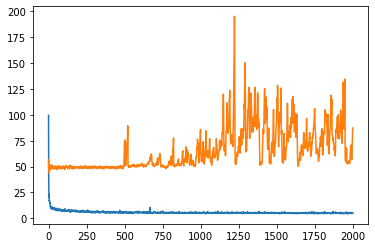

In [22]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [23]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = multi_channel_cnn_model.predict([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6])
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [24]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 53.702684904041696


# Make predictions based on test set and get a root mean squared error 

In [25]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = multi_channel_cnn_model.predict([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6])
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [26]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 300.66760403260304


# Plot train labels along with train predictions

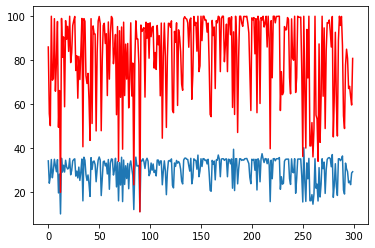

In [27]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

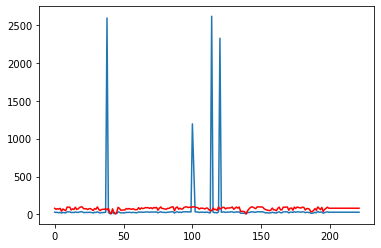

In [28]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with normalization of features

In [29]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [30]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [31]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [32]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [33]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [34]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [35]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [36]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [37]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [38]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [39]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [40]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [41]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 6)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 6)
Shape of test_y: (222,)


# Must split multivariate time series into individual univariate time series to be fed into each channel in the model

In [42]:
train_X1 = []
train_X2 = []
train_X3 = []
train_X4 = []
train_X5 = []
train_X6 = []

for i in train_X:
    train_X1.append([x[0] for x in i])
    train_X2.append([x[1] for x in i])
    train_X3.append([x[2] for x in i])
    train_X4.append([x[3] for x in i])
    train_X5.append([x[4] for x in i])
    train_X6.append([x[5] for x in i])

In [43]:
np.array(train_X2).shape

train_X1 = np.array(train_X1)
train_X2 = np.array(train_X2)
train_X3 = np.array(train_X3)
train_X4 = np.array(train_X4)
train_X5 = np.array(train_X5)
train_X6 = np.array(train_X6)

In [44]:
test_X1 = []
test_X2 = []
test_X3 = []
test_X4 = []
test_X5 = []
test_X6 = []

for i in test_X:
    test_X1.append([x[0] for x in i])
    test_X2.append([x[1] for x in i])
    test_X3.append([x[2] for x in i])
    test_X4.append([x[3] for x in i])
    test_X5.append([x[4] for x in i])
    test_X6.append([x[5] for x in i])

In [45]:
np.array(train_X2).shape

test_X1 = np.array(test_X1)
test_X2 = np.array(test_X2)
test_X3 = np.array(test_X3)
test_X4 = np.array(test_X4)
test_X5 = np.array(test_X5)
test_X6 = np.array(test_X6)

# Build multi-channel cnn model

In [46]:
### Build a channel for each of the 6 variables

# channel 1
inputs1 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv1 = tf.keras.layers.Conv1D(filters=8, kernel_size=5, activation='relu')(inputs1)
drop1 = tf.keras.layers.Dropout(0.5)(conv1)
pool1 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1)
conv1_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool1)
drop1_2 = tf.keras.layers.Dropout(0.5)(conv1_2)
pool1_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1_2)
flat1 = tf.keras.layers.Flatten()(pool1_2)

# channel 2
inputs2 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv2 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs2)
drop2 = tf.keras.layers.Dropout(0.5)(conv2)
pool2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2)
conv2_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool2)
drop2_2 = tf.keras.layers.Dropout(0.5)(conv2_2)
pool2_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2_2)
flat2 = tf.keras.layers.Flatten()(pool2_2)

# channel 3
inputs3 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv3 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs3)
drop3 = tf.keras.layers.Dropout(0.5)(conv3)
pool3 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3)
conv3_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool3)
drop3_2 = tf.keras.layers.Dropout(0.5)(conv3_2)
pool3_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3_2)
flat3 = tf.keras.layers.Flatten()(pool3_2)

# channel 4
inputs4 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv4 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs4)
drop4 = tf.keras.layers.Dropout(0.5)(conv4)
pool4 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4)
conv4_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool4)
drop4_2 = tf.keras.layers.Dropout(0.5)(conv4_2)
pool4_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4_2)
flat4 = tf.keras.layers.Flatten()(pool4_2)

# channel 5
inputs5 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv5 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs5)
drop5 = tf.keras.layers.Dropout(0.5)(conv5)
pool5 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5)
conv5_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool5)
drop5_2 = tf.keras.layers.Dropout(0.5)(conv5_2)
pool5_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5_2)
flat5 = tf.keras.layers.Flatten()(pool5_2)

# channel 6
inputs6 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv6 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs6)
drop6 = tf.keras.layers.Dropout(0.5)(conv6)
pool6 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6)
conv6_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool6)
drop6_2 = tf.keras.layers.Dropout(0.5)(conv6_2)
pool6_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6_2)
flat6 = tf.keras.layers.Flatten()(pool6_2)

# merge
merged = tf.keras.layers.concatenate([flat1, flat2, flat3, flat4, flat5, flat6])

# dense output layers
dense1 = tf.keras.layers.Dense(units=732, activation='relu')(merged)
output = tf.keras.layers.Dense(units=1)(dense1)

multi_channel_cnn_norm_model = tf.keras.Model(inputs=[inputs1, inputs2, inputs3, inputs4, inputs5, inputs6], outputs=output)

print(multi_channel_cnn_norm_model.summary())

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_8 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_9 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_10 (InputLayer)           [(None, 21, 1)]      0                                            
_______________________________________________________________________________________

# Compile model

In [47]:
from tensorflow import keras

multi_channel_cnn_norm_model.compile(loss='mae', optimizer='adam')

# Train model

In [48]:
history = multi_channel_cnn_norm_model.fit([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6], train_y, epochs=2000, batch_size=32, 
                                      validation_data=([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6], test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 0s - loss: 0.5496 - val_loss: 0.2439
Epoch 2/2000
10/10 - 0s - loss: 0.3337 - val_loss: 0.4040
Epoch 3/2000
10/10 - 0s - loss: 0.2412 - val_loss: 0.2063
Epoch 4/2000
10/10 - 0s - loss: 0.2444 - val_loss: 0.3115
Epoch 5/2000
10/10 - 0s - loss: 0.1879 - val_loss: 0.1918
Epoch 6/2000
10/10 - 0s - loss: 0.1995 - val_loss: 0.2272
Epoch 7/2000
10/10 - 0s - loss: 0.1814 - val_loss: 0.1733
Epoch 8/2000
10/10 - 0s - loss: 0.1925 - val_loss: 0.1918
Epoch 9/2000
10/10 - 0s - loss: 0.1720 - val_loss: 0.1761
Epoch 10/2000
10/10 - 0s - loss: 0.1884 - val_loss: 0.1689
Epoch 11/2000
10/10 - 0s - loss: 0.1684 - val_loss: 0.1631
Epoch 12/2000
10/10 - 0s - loss: 0.1727 - val_loss: 0.1628
Epoch 13/2000
10/10 - 0s - loss: 0.1748 - val_loss: 0.1629
Epoch 14/2000
10/10 - 0s - loss: 0.1619 - val_loss: 0.1622
Epoch 15/2000
10/10 - 0s - loss: 0.1724 - val_loss: 0.1542
Epoch 16/2000
10/10 - 0s - loss: 0.1633 - val_loss: 0.1661
Epoch 17/2000
10/10 - 0s - loss: 0.1621 - val_loss: 0.1518
Epoch 

Epoch 140/2000
10/10 - 0s - loss: 0.1310 - val_loss: 0.1633
Epoch 141/2000
10/10 - 0s - loss: 0.1264 - val_loss: 0.1593
Epoch 142/2000
10/10 - 0s - loss: 0.1283 - val_loss: 0.1555
Epoch 143/2000
10/10 - 0s - loss: 0.1325 - val_loss: 0.1640
Epoch 144/2000
10/10 - 0s - loss: 0.1348 - val_loss: 0.1567
Epoch 145/2000
10/10 - 0s - loss: 0.1396 - val_loss: 0.1535
Epoch 146/2000
10/10 - 0s - loss: 0.1330 - val_loss: 0.1630
Epoch 147/2000
10/10 - 0s - loss: 0.1324 - val_loss: 0.1626
Epoch 148/2000
10/10 - 0s - loss: 0.1268 - val_loss: 0.1573
Epoch 149/2000
10/10 - 0s - loss: 0.1265 - val_loss: 0.1676
Epoch 150/2000
10/10 - 0s - loss: 0.1313 - val_loss: 0.1688
Epoch 151/2000
10/10 - 0s - loss: 0.1355 - val_loss: 0.1561
Epoch 152/2000
10/10 - 0s - loss: 0.1310 - val_loss: 0.1692
Epoch 153/2000
10/10 - 0s - loss: 0.1324 - val_loss: 0.1529
Epoch 154/2000
10/10 - 0s - loss: 0.1229 - val_loss: 0.1590
Epoch 155/2000
10/10 - 0s - loss: 0.1281 - val_loss: 0.1693
Epoch 156/2000
10/10 - 0s - loss: 0.1273

Epoch 277/2000
10/10 - 0s - loss: 0.1126 - val_loss: 0.1655
Epoch 278/2000
10/10 - 0s - loss: 0.1156 - val_loss: 0.1586
Epoch 279/2000
10/10 - 0s - loss: 0.1114 - val_loss: 0.1659
Epoch 280/2000
10/10 - 0s - loss: 0.1132 - val_loss: 0.1634
Epoch 281/2000
10/10 - 0s - loss: 0.1110 - val_loss: 0.1510
Epoch 282/2000
10/10 - 0s - loss: 0.1239 - val_loss: 0.1652
Epoch 283/2000
10/10 - 0s - loss: 0.1215 - val_loss: 0.1594
Epoch 284/2000
10/10 - 0s - loss: 0.1157 - val_loss: 0.1547
Epoch 285/2000
10/10 - 0s - loss: 0.1209 - val_loss: 0.1602
Epoch 286/2000
10/10 - 0s - loss: 0.1202 - val_loss: 0.1627
Epoch 287/2000
10/10 - 0s - loss: 0.1095 - val_loss: 0.1595
Epoch 288/2000
10/10 - 0s - loss: 0.1112 - val_loss: 0.1585
Epoch 289/2000
10/10 - 0s - loss: 0.1111 - val_loss: 0.1579
Epoch 290/2000
10/10 - 0s - loss: 0.1171 - val_loss: 0.1603
Epoch 291/2000
10/10 - 0s - loss: 0.1135 - val_loss: 0.1622
Epoch 292/2000
10/10 - 0s - loss: 0.1181 - val_loss: 0.1554
Epoch 293/2000
10/10 - 0s - loss: 0.1199

Epoch 414/2000
10/10 - 0s - loss: 0.1106 - val_loss: 0.1499
Epoch 415/2000
10/10 - 0s - loss: 0.1107 - val_loss: 0.1619
Epoch 416/2000
10/10 - 0s - loss: 0.1105 - val_loss: 0.1557
Epoch 417/2000
10/10 - 0s - loss: 0.1051 - val_loss: 0.1526
Epoch 418/2000
10/10 - 0s - loss: 0.0984 - val_loss: 0.1529
Epoch 419/2000
10/10 - 0s - loss: 0.1094 - val_loss: 0.1630
Epoch 420/2000
10/10 - 0s - loss: 0.1111 - val_loss: 0.1640
Epoch 421/2000
10/10 - 0s - loss: 0.1040 - val_loss: 0.1571
Epoch 422/2000
10/10 - 0s - loss: 0.1157 - val_loss: 0.1477
Epoch 423/2000
10/10 - 0s - loss: 0.1130 - val_loss: 0.1609
Epoch 424/2000
10/10 - 0s - loss: 0.1069 - val_loss: 0.1557
Epoch 425/2000
10/10 - 0s - loss: 0.1144 - val_loss: 0.1576
Epoch 426/2000
10/10 - 0s - loss: 0.1028 - val_loss: 0.1585
Epoch 427/2000
10/10 - 0s - loss: 0.1059 - val_loss: 0.1640
Epoch 428/2000
10/10 - 0s - loss: 0.1159 - val_loss: 0.1564
Epoch 429/2000
10/10 - 0s - loss: 0.1073 - val_loss: 0.1541
Epoch 430/2000
10/10 - 0s - loss: 0.1067

Epoch 551/2000
10/10 - 0s - loss: 0.1040 - val_loss: 0.1502
Epoch 552/2000
10/10 - 0s - loss: 0.1043 - val_loss: 0.1515
Epoch 553/2000
10/10 - 0s - loss: 0.1018 - val_loss: 0.1583
Epoch 554/2000
10/10 - 0s - loss: 0.1074 - val_loss: 0.1500
Epoch 555/2000
10/10 - 0s - loss: 0.1035 - val_loss: 0.1493
Epoch 556/2000
10/10 - 0s - loss: 0.1012 - val_loss: 0.1579
Epoch 557/2000
10/10 - 0s - loss: 0.1032 - val_loss: 0.1467
Epoch 558/2000
10/10 - 0s - loss: 0.1026 - val_loss: 0.1478
Epoch 559/2000
10/10 - 0s - loss: 0.1072 - val_loss: 0.1608
Epoch 560/2000
10/10 - 0s - loss: 0.1028 - val_loss: 0.1495
Epoch 561/2000
10/10 - 0s - loss: 0.0965 - val_loss: 0.1564
Epoch 562/2000
10/10 - 0s - loss: 0.1071 - val_loss: 0.1553
Epoch 563/2000
10/10 - 0s - loss: 0.1040 - val_loss: 0.1469
Epoch 564/2000
10/10 - 0s - loss: 0.0987 - val_loss: 0.1521
Epoch 565/2000
10/10 - 0s - loss: 0.1023 - val_loss: 0.1615
Epoch 566/2000
10/10 - 0s - loss: 0.1024 - val_loss: 0.1475
Epoch 567/2000
10/10 - 0s - loss: 0.1025

Epoch 688/2000
10/10 - 0s - loss: 0.0919 - val_loss: 0.1528
Epoch 689/2000
10/10 - 0s - loss: 0.0946 - val_loss: 0.1548
Epoch 690/2000
10/10 - 0s - loss: 0.0945 - val_loss: 0.1477
Epoch 691/2000
10/10 - 0s - loss: 0.0932 - val_loss: 0.1529
Epoch 692/2000
10/10 - 0s - loss: 0.0870 - val_loss: 0.1486
Epoch 693/2000
10/10 - 0s - loss: 0.0908 - val_loss: 0.1488
Epoch 694/2000
10/10 - 0s - loss: 0.0920 - val_loss: 0.1526
Epoch 695/2000
10/10 - 0s - loss: 0.0906 - val_loss: 0.1568
Epoch 696/2000
10/10 - 0s - loss: 0.1012 - val_loss: 0.1513
Epoch 697/2000
10/10 - 0s - loss: 0.0954 - val_loss: 0.1490
Epoch 698/2000
10/10 - 0s - loss: 0.0922 - val_loss: 0.1538
Epoch 699/2000
10/10 - 0s - loss: 0.0917 - val_loss: 0.1517
Epoch 700/2000
10/10 - 0s - loss: 0.0882 - val_loss: 0.1537
Epoch 701/2000
10/10 - 0s - loss: 0.0974 - val_loss: 0.1546
Epoch 702/2000
10/10 - 0s - loss: 0.0924 - val_loss: 0.1526
Epoch 703/2000
10/10 - 0s - loss: 0.0884 - val_loss: 0.1548
Epoch 704/2000
10/10 - 0s - loss: 0.0947

Epoch 825/2000
10/10 - 0s - loss: 0.0882 - val_loss: 0.1502
Epoch 826/2000
10/10 - 0s - loss: 0.0884 - val_loss: 0.1473
Epoch 827/2000
10/10 - 0s - loss: 0.0911 - val_loss: 0.1487
Epoch 828/2000
10/10 - 0s - loss: 0.0930 - val_loss: 0.1531
Epoch 829/2000
10/10 - 0s - loss: 0.0919 - val_loss: 0.1475
Epoch 830/2000
10/10 - 0s - loss: 0.0840 - val_loss: 0.1440
Epoch 831/2000
10/10 - 0s - loss: 0.0954 - val_loss: 0.1579
Epoch 832/2000
10/10 - 0s - loss: 0.0953 - val_loss: 0.1527
Epoch 833/2000
10/10 - 0s - loss: 0.0929 - val_loss: 0.1472
Epoch 834/2000
10/10 - 0s - loss: 0.0887 - val_loss: 0.1485
Epoch 835/2000
10/10 - 0s - loss: 0.0926 - val_loss: 0.1577
Epoch 836/2000
10/10 - 0s - loss: 0.0932 - val_loss: 0.1484
Epoch 837/2000
10/10 - 0s - loss: 0.0832 - val_loss: 0.1432
Epoch 838/2000
10/10 - 0s - loss: 0.0950 - val_loss: 0.1510
Epoch 839/2000
10/10 - 0s - loss: 0.0981 - val_loss: 0.1517
Epoch 840/2000
10/10 - 0s - loss: 0.0926 - val_loss: 0.1475
Epoch 841/2000
10/10 - 0s - loss: 0.0919

Epoch 962/2000
10/10 - 0s - loss: 0.0949 - val_loss: 0.1523
Epoch 963/2000
10/10 - 0s - loss: 0.0850 - val_loss: 0.1469
Epoch 964/2000
10/10 - 0s - loss: 0.0932 - val_loss: 0.1512
Epoch 965/2000
10/10 - 0s - loss: 0.0864 - val_loss: 0.1535
Epoch 966/2000
10/10 - 0s - loss: 0.0792 - val_loss: 0.1517
Epoch 967/2000
10/10 - 0s - loss: 0.0905 - val_loss: 0.1489
Epoch 968/2000
10/10 - 0s - loss: 0.0897 - val_loss: 0.1543
Epoch 969/2000
10/10 - 0s - loss: 0.0844 - val_loss: 0.1553
Epoch 970/2000
10/10 - 0s - loss: 0.0822 - val_loss: 0.1513
Epoch 971/2000
10/10 - 0s - loss: 0.0849 - val_loss: 0.1487
Epoch 972/2000
10/10 - 0s - loss: 0.0881 - val_loss: 0.1603
Epoch 973/2000
10/10 - 0s - loss: 0.0982 - val_loss: 0.1549
Epoch 974/2000
10/10 - 0s - loss: 0.0858 - val_loss: 0.1484
Epoch 975/2000
10/10 - 0s - loss: 0.0894 - val_loss: 0.1537
Epoch 976/2000
10/10 - 0s - loss: 0.0923 - val_loss: 0.1564
Epoch 977/2000
10/10 - 0s - loss: 0.0891 - val_loss: 0.1506
Epoch 978/2000
10/10 - 0s - loss: 0.0877

Epoch 1097/2000
10/10 - 0s - loss: 0.0883 - val_loss: 0.1579
Epoch 1098/2000
10/10 - 0s - loss: 0.0802 - val_loss: 0.1551
Epoch 1099/2000
10/10 - 0s - loss: 0.0905 - val_loss: 0.1482
Epoch 1100/2000
10/10 - 0s - loss: 0.0846 - val_loss: 0.1503
Epoch 1101/2000
10/10 - 0s - loss: 0.0885 - val_loss: 0.1550
Epoch 1102/2000
10/10 - 0s - loss: 0.0913 - val_loss: 0.1457
Epoch 1103/2000
10/10 - 0s - loss: 0.0865 - val_loss: 0.1581
Epoch 1104/2000
10/10 - 0s - loss: 0.0883 - val_loss: 0.1535
Epoch 1105/2000
10/10 - 0s - loss: 0.0875 - val_loss: 0.1550
Epoch 1106/2000
10/10 - 0s - loss: 0.0815 - val_loss: 0.1497
Epoch 1107/2000
10/10 - 0s - loss: 0.0899 - val_loss: 0.1518
Epoch 1108/2000
10/10 - 0s - loss: 0.0834 - val_loss: 0.1526
Epoch 1109/2000
10/10 - 0s - loss: 0.0846 - val_loss: 0.1471
Epoch 1110/2000
10/10 - 0s - loss: 0.0888 - val_loss: 0.1513
Epoch 1111/2000
10/10 - 0s - loss: 0.0862 - val_loss: 0.1531
Epoch 1112/2000
10/10 - 0s - loss: 0.0838 - val_loss: 0.1502
Epoch 1113/2000
10/10 - 

Epoch 1232/2000
10/10 - 0s - loss: 0.0747 - val_loss: 0.1498
Epoch 1233/2000
10/10 - 0s - loss: 0.0844 - val_loss: 0.1524
Epoch 1234/2000
10/10 - 0s - loss: 0.0847 - val_loss: 0.1531
Epoch 1235/2000
10/10 - 0s - loss: 0.0829 - val_loss: 0.1497
Epoch 1236/2000
10/10 - 0s - loss: 0.0828 - val_loss: 0.1496
Epoch 1237/2000
10/10 - 0s - loss: 0.0800 - val_loss: 0.1552
Epoch 1238/2000
10/10 - 0s - loss: 0.0818 - val_loss: 0.1459
Epoch 1239/2000
10/10 - 0s - loss: 0.0830 - val_loss: 0.1541
Epoch 1240/2000
10/10 - 0s - loss: 0.0862 - val_loss: 0.1504
Epoch 1241/2000
10/10 - 0s - loss: 0.0805 - val_loss: 0.1479
Epoch 1242/2000
10/10 - 0s - loss: 0.0865 - val_loss: 0.1509
Epoch 1243/2000
10/10 - 0s - loss: 0.0850 - val_loss: 0.1514
Epoch 1244/2000
10/10 - 0s - loss: 0.0835 - val_loss: 0.1496
Epoch 1245/2000
10/10 - 0s - loss: 0.0899 - val_loss: 0.1466
Epoch 1246/2000
10/10 - 0s - loss: 0.0863 - val_loss: 0.1551
Epoch 1247/2000
10/10 - 0s - loss: 0.0882 - val_loss: 0.1492
Epoch 1248/2000
10/10 - 

Epoch 1367/2000
10/10 - 0s - loss: 0.0816 - val_loss: 0.1468
Epoch 1368/2000
10/10 - 0s - loss: 0.0802 - val_loss: 0.1505
Epoch 1369/2000
10/10 - 0s - loss: 0.0824 - val_loss: 0.1530
Epoch 1370/2000
10/10 - 0s - loss: 0.0851 - val_loss: 0.1518
Epoch 1371/2000
10/10 - 0s - loss: 0.0787 - val_loss: 0.1500
Epoch 1372/2000
10/10 - 0s - loss: 0.0822 - val_loss: 0.1512
Epoch 1373/2000
10/10 - 0s - loss: 0.0873 - val_loss: 0.1615
Epoch 1374/2000
10/10 - 0s - loss: 0.0830 - val_loss: 0.1491
Epoch 1375/2000
10/10 - 0s - loss: 0.0877 - val_loss: 0.1504
Epoch 1376/2000
10/10 - 0s - loss: 0.0902 - val_loss: 0.1567
Epoch 1377/2000
10/10 - 0s - loss: 0.0905 - val_loss: 0.1526
Epoch 1378/2000
10/10 - 0s - loss: 0.0773 - val_loss: 0.1524
Epoch 1379/2000
10/10 - 0s - loss: 0.0813 - val_loss: 0.1528
Epoch 1380/2000
10/10 - 0s - loss: 0.0745 - val_loss: 0.1515
Epoch 1381/2000
10/10 - 0s - loss: 0.0800 - val_loss: 0.1553
Epoch 1382/2000
10/10 - 0s - loss: 0.0830 - val_loss: 0.1525
Epoch 1383/2000
10/10 - 

Epoch 1502/2000
10/10 - 0s - loss: 0.0789 - val_loss: 0.1560
Epoch 1503/2000
10/10 - 0s - loss: 0.0872 - val_loss: 0.1505
Epoch 1504/2000
10/10 - 0s - loss: 0.0855 - val_loss: 0.1559
Epoch 1505/2000
10/10 - 0s - loss: 0.0772 - val_loss: 0.1540
Epoch 1506/2000
10/10 - 0s - loss: 0.0811 - val_loss: 0.1542
Epoch 1507/2000
10/10 - 0s - loss: 0.0787 - val_loss: 0.1545
Epoch 1508/2000
10/10 - 0s - loss: 0.0806 - val_loss: 0.1545
Epoch 1509/2000
10/10 - 0s - loss: 0.0766 - val_loss: 0.1483
Epoch 1510/2000
10/10 - 0s - loss: 0.0866 - val_loss: 0.1555
Epoch 1511/2000
10/10 - 0s - loss: 0.0821 - val_loss: 0.1565
Epoch 1512/2000
10/10 - 0s - loss: 0.0750 - val_loss: 0.1522
Epoch 1513/2000
10/10 - 0s - loss: 0.0803 - val_loss: 0.1529
Epoch 1514/2000
10/10 - 0s - loss: 0.0808 - val_loss: 0.1513
Epoch 1515/2000
10/10 - 0s - loss: 0.0756 - val_loss: 0.1513
Epoch 1516/2000
10/10 - 0s - loss: 0.0798 - val_loss: 0.1501
Epoch 1517/2000
10/10 - 0s - loss: 0.0728 - val_loss: 0.1520
Epoch 1518/2000
10/10 - 

Epoch 1637/2000
10/10 - 0s - loss: 0.0725 - val_loss: 0.1520
Epoch 1638/2000
10/10 - 0s - loss: 0.0746 - val_loss: 0.1543
Epoch 1639/2000
10/10 - 0s - loss: 0.0714 - val_loss: 0.1551
Epoch 1640/2000
10/10 - 0s - loss: 0.0775 - val_loss: 0.1558
Epoch 1641/2000
10/10 - 0s - loss: 0.0770 - val_loss: 0.1524
Epoch 1642/2000
10/10 - 0s - loss: 0.0704 - val_loss: 0.1549
Epoch 1643/2000
10/10 - 0s - loss: 0.0806 - val_loss: 0.1581
Epoch 1644/2000
10/10 - 0s - loss: 0.0772 - val_loss: 0.1569
Epoch 1645/2000
10/10 - 0s - loss: 0.0717 - val_loss: 0.1522
Epoch 1646/2000
10/10 - 0s - loss: 0.0757 - val_loss: 0.1511
Epoch 1647/2000
10/10 - 0s - loss: 0.0808 - val_loss: 0.1496
Epoch 1648/2000
10/10 - 0s - loss: 0.0734 - val_loss: 0.1504
Epoch 1649/2000
10/10 - 0s - loss: 0.0725 - val_loss: 0.1523
Epoch 1650/2000
10/10 - 0s - loss: 0.0735 - val_loss: 0.1613
Epoch 1651/2000
10/10 - 0s - loss: 0.0792 - val_loss: 0.1557
Epoch 1652/2000
10/10 - 0s - loss: 0.0813 - val_loss: 0.1503
Epoch 1653/2000
10/10 - 

Epoch 1772/2000
10/10 - 0s - loss: 0.0785 - val_loss: 0.1534
Epoch 1773/2000
10/10 - 0s - loss: 0.0813 - val_loss: 0.1511
Epoch 1774/2000
10/10 - 0s - loss: 0.0813 - val_loss: 0.1580
Epoch 1775/2000
10/10 - 0s - loss: 0.0790 - val_loss: 0.1529
Epoch 1776/2000
10/10 - 0s - loss: 0.0730 - val_loss: 0.1563
Epoch 1777/2000
10/10 - 0s - loss: 0.0795 - val_loss: 0.1544
Epoch 1778/2000
10/10 - 0s - loss: 0.0748 - val_loss: 0.1534
Epoch 1779/2000
10/10 - 0s - loss: 0.0742 - val_loss: 0.1554
Epoch 1780/2000
10/10 - 0s - loss: 0.0821 - val_loss: 0.1614
Epoch 1781/2000
10/10 - 0s - loss: 0.0811 - val_loss: 0.1527
Epoch 1782/2000
10/10 - 0s - loss: 0.0751 - val_loss: 0.1541
Epoch 1783/2000
10/10 - 0s - loss: 0.0784 - val_loss: 0.1579
Epoch 1784/2000
10/10 - 0s - loss: 0.0800 - val_loss: 0.1542
Epoch 1785/2000
10/10 - 0s - loss: 0.0770 - val_loss: 0.1512
Epoch 1786/2000
10/10 - 0s - loss: 0.0761 - val_loss: 0.1590
Epoch 1787/2000
10/10 - 0s - loss: 0.0724 - val_loss: 0.1511
Epoch 1788/2000
10/10 - 

Epoch 1907/2000
10/10 - 0s - loss: 0.0760 - val_loss: 0.1530
Epoch 1908/2000
10/10 - 0s - loss: 0.0679 - val_loss: 0.1493
Epoch 1909/2000
10/10 - 0s - loss: 0.0718 - val_loss: 0.1564
Epoch 1910/2000
10/10 - 0s - loss: 0.0768 - val_loss: 0.1534
Epoch 1911/2000
10/10 - 0s - loss: 0.0716 - val_loss: 0.1524
Epoch 1912/2000
10/10 - 0s - loss: 0.0767 - val_loss: 0.1567
Epoch 1913/2000
10/10 - 0s - loss: 0.0756 - val_loss: 0.1531
Epoch 1914/2000
10/10 - 0s - loss: 0.0735 - val_loss: 0.1539
Epoch 1915/2000
10/10 - 0s - loss: 0.0777 - val_loss: 0.1517
Epoch 1916/2000
10/10 - 0s - loss: 0.0778 - val_loss: 0.1531
Epoch 1917/2000
10/10 - 0s - loss: 0.0722 - val_loss: 0.1537
Epoch 1918/2000
10/10 - 0s - loss: 0.0765 - val_loss: 0.1512
Epoch 1919/2000
10/10 - 0s - loss: 0.0769 - val_loss: 0.1548
Epoch 1920/2000
10/10 - 0s - loss: 0.0747 - val_loss: 0.1490
Epoch 1921/2000
10/10 - 0s - loss: 0.0769 - val_loss: 0.1524
Epoch 1922/2000
10/10 - 0s - loss: 0.0758 - val_loss: 0.1543
Epoch 1923/2000
10/10 - 

# Plot model loss and validation loss

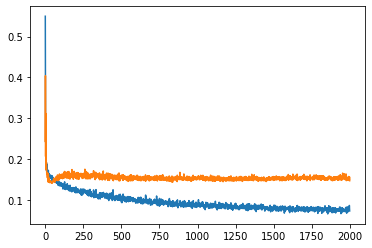

In [49]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [50]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = multi_channel_cnn_norm_model.predict([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6])
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [51]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.12516156248472302


# Make predictions based on test set and get a root mean squared error 

In [52]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = multi_channel_cnn_norm_model.predict([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6])
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [53]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.19607067863959643


# Plot train labels along with train predictions

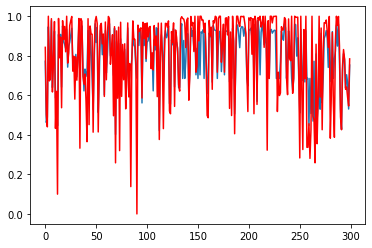

In [54]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

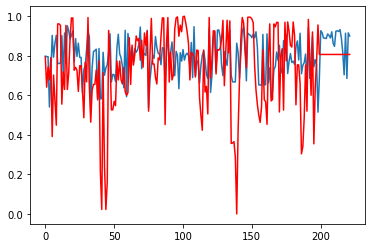

In [55]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with the addition of weather data

In [56]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [57]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [58]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [59]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [60]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [61]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [62]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [63]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [64]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [65]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [66]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [67]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [68]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [69]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 9)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 9)
Shape of test_y: (222,)


# Must split multivariate time series into individual univariate time series to be fed into each channel in the model

In [70]:
train_X1 = []
train_X2 = []
train_X3 = []
train_X4 = []
train_X5 = []
train_X6 = []
train_X7 = []
train_X8 = []
train_X9 = []


for i in train_X:
    train_X1.append([x[0] for x in i])
    train_X2.append([x[1] for x in i])
    train_X3.append([x[2] for x in i])
    train_X4.append([x[3] for x in i])
    train_X5.append([x[4] for x in i])
    train_X6.append([x[5] for x in i])
    train_X7.append([x[6] for x in i])
    train_X8.append([x[7] for x in i])
    train_X9.append([x[8] for x in i])

In [71]:
np.array(train_X2).shape

train_X1 = np.array(train_X1)
train_X2 = np.array(train_X2)
train_X3 = np.array(train_X3)
train_X4 = np.array(train_X4)
train_X5 = np.array(train_X5)
train_X6 = np.array(train_X6)
train_X7 = np.array(train_X7)
train_X8 = np.array(train_X8)
train_X9 = np.array(train_X9)

In [72]:
test_X1 = []
test_X2 = []
test_X3 = []
test_X4 = []
test_X5 = []
test_X6 = []
test_X7 = []
test_X8 = []
test_X9 = []

for i in test_X:
    test_X1.append([x[0] for x in i])
    test_X2.append([x[1] for x in i])
    test_X3.append([x[2] for x in i])
    test_X4.append([x[3] for x in i])
    test_X5.append([x[4] for x in i])
    test_X6.append([x[5] for x in i])
    test_X7.append([x[6] for x in i])
    test_X8.append([x[7] for x in i])
    test_X9.append([x[8] for x in i])

In [73]:
np.array(train_X2).shape

test_X1 = np.array(test_X1)
test_X2 = np.array(test_X2)
test_X3 = np.array(test_X3)
test_X4 = np.array(test_X4)
test_X5 = np.array(test_X5)
test_X6 = np.array(test_X6)
test_X7 = np.array(test_X7)
test_X8 = np.array(test_X8)
test_X9 = np.array(test_X9)

# Build multi-channel cnn model

In [74]:
### Build a channel for each of the 6 variables

# channel 1
inputs1 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv1 = tf.keras.layers.Conv1D(filters=8, kernel_size=5, activation='relu')(inputs1)
drop1 = tf.keras.layers.Dropout(0.5)(conv1)
pool1 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1)
conv1_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool1)
drop1_2 = tf.keras.layers.Dropout(0.5)(conv1_2)
pool1_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1_2)
flat1 = tf.keras.layers.Flatten()(pool1_2)

# channel 2
inputs2 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv2 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs2)
drop2 = tf.keras.layers.Dropout(0.5)(conv2)
pool2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2)
conv2_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool2)
drop2_2 = tf.keras.layers.Dropout(0.5)(conv2_2)
pool2_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2_2)
flat2 = tf.keras.layers.Flatten()(pool2_2)

# channel 3
inputs3 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv3 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs3)
drop3 = tf.keras.layers.Dropout(0.5)(conv3)
pool3 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3)
conv3_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool3)
drop3_2 = tf.keras.layers.Dropout(0.5)(conv3_2)
pool3_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3_2)
flat3 = tf.keras.layers.Flatten()(pool3_2)

# channel 4
inputs4 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv4 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs4)
drop4 = tf.keras.layers.Dropout(0.5)(conv4)
pool4 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4)
conv4_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool4)
drop4_2 = tf.keras.layers.Dropout(0.5)(conv4_2)
pool4_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4_2)
flat4 = tf.keras.layers.Flatten()(pool4_2)

# channel 5
inputs5 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv5 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs5)
drop5 = tf.keras.layers.Dropout(0.5)(conv5)
pool5 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5)
conv5_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool5)
drop5_2 = tf.keras.layers.Dropout(0.5)(conv5_2)
pool5_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5_2)
flat5 = tf.keras.layers.Flatten()(pool5_2)

# channel 6
inputs6 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv6 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs6)
drop6 = tf.keras.layers.Dropout(0.5)(conv6)
pool6 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6)
conv6_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool6)
drop6_2 = tf.keras.layers.Dropout(0.5)(conv6_2)
pool6_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6_2)
flat6 = tf.keras.layers.Flatten()(pool6_2)

# channel 7
inputs7 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv7 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs7)
drop7 = tf.keras.layers.Dropout(0.5)(conv7)
pool7 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop7)
conv7_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool7)
drop7_2 = tf.keras.layers.Dropout(0.5)(conv7_2)
pool7_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop7_2)
flat7 = tf.keras.layers.Flatten()(pool7_2)

# channel 8
inputs8 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv8 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs8)
drop8 = tf.keras.layers.Dropout(0.5)(conv8)
pool8 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop8)
conv8_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool8)
drop8_2 = tf.keras.layers.Dropout(0.5)(conv8_2)
pool8_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop8_2)
flat8 = tf.keras.layers.Flatten()(pool8_2)

# channel 9
inputs9 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv9 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs9)
drop9 = tf.keras.layers.Dropout(0.5)(conv9)
pool9 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop9)
conv9_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool9)
drop9_2 = tf.keras.layers.Dropout(0.5)(conv9_2)
pool9_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop9_2)
flat9 = tf.keras.layers.Flatten()(pool9_2)

# merge
merged = tf.keras.layers.concatenate([flat1, flat2, flat3, flat4, flat5, flat6, flat7, flat8, flat9])

# dense output layers
dense1 = tf.keras.layers.Dense(units=732, activation='relu')(merged)
output = tf.keras.layers.Dense(units=1)(dense1)

multi_channel_cnn_weather_model = tf.keras.Model(inputs=[inputs1, inputs2, inputs3, inputs4, inputs5, inputs6, inputs7,
                                                        inputs8, inputs9], outputs=output)

print(multi_channel_cnn_weather_model.summary())

Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_14 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_15 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_16 (InputLayer)           [(None, 21, 1)]      0                                            
_______________________________________________________________________________________

# Compile model

In [75]:
from tensorflow import keras

multi_channel_cnn_weather_model.compile(loss='mae', optimizer='adam')

# Train model

In [76]:
history = multi_channel_cnn_weather_model.fit([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6, train_X7, train_X8, train_X9], train_y, epochs=2000, batch_size=32, 
                                      validation_data=([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6, test_X7, test_X8, test_X9], test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 0s - loss: 32.7877 - val_loss: 13.5553
Epoch 2/2000
10/10 - 0s - loss: 4.7270 - val_loss: 9.5103
Epoch 3/2000
10/10 - 0s - loss: 3.1693 - val_loss: 10.7913
Epoch 4/2000
10/10 - 0s - loss: 1.9938 - val_loss: 10.1980
Epoch 5/2000
10/10 - 0s - loss: 1.8292 - val_loss: 11.0139
Epoch 6/2000
10/10 - 0s - loss: 1.4898 - val_loss: 11.1767
Epoch 7/2000
10/10 - 0s - loss: 1.1928 - val_loss: 10.8506
Epoch 8/2000
10/10 - 0s - loss: 1.8848 - val_loss: 10.7401
Epoch 9/2000
10/10 - 0s - loss: 1.0729 - val_loss: 10.0116
Epoch 10/2000
10/10 - 0s - loss: 1.1451 - val_loss: 10.0771
Epoch 11/2000
10/10 - 0s - loss: 1.2538 - val_loss: 10.4671
Epoch 12/2000
10/10 - 0s - loss: 1.0018 - val_loss: 10.7577
Epoch 13/2000
10/10 - 0s - loss: 0.9070 - val_loss: 10.3211
Epoch 14/2000
10/10 - 0s - loss: 0.9704 - val_loss: 10.4620
Epoch 15/2000
10/10 - 0s - loss: 1.0246 - val_loss: 10.4860
Epoch 16/2000
10/10 - 0s - loss: 0.9027 - val_loss: 10.5852
Epoch 17/2000
10/10 - 0s - loss: 1.0203 - val_los

Epoch 139/2000
10/10 - 0s - loss: 0.4156 - val_loss: 9.2443
Epoch 140/2000
10/10 - 0s - loss: 0.5157 - val_loss: 9.4283
Epoch 141/2000
10/10 - 0s - loss: 0.4160 - val_loss: 9.5310
Epoch 142/2000
10/10 - 0s - loss: 1.0161 - val_loss: 9.4153
Epoch 143/2000
10/10 - 0s - loss: 0.3869 - val_loss: 9.6132
Epoch 144/2000
10/10 - 0s - loss: 0.4727 - val_loss: 9.5452
Epoch 145/2000
10/10 - 0s - loss: 0.4123 - val_loss: 9.6710
Epoch 146/2000
10/10 - 0s - loss: 0.4249 - val_loss: 9.4371
Epoch 147/2000
10/10 - 0s - loss: 0.4025 - val_loss: 9.4335
Epoch 148/2000
10/10 - 0s - loss: 0.4571 - val_loss: 9.4427
Epoch 149/2000
10/10 - 0s - loss: 0.4649 - val_loss: 9.3158
Epoch 150/2000
10/10 - 0s - loss: 0.4484 - val_loss: 9.3421
Epoch 151/2000
10/10 - 0s - loss: 0.4879 - val_loss: 9.2273
Epoch 152/2000
10/10 - 0s - loss: 0.5163 - val_loss: 9.1552
Epoch 153/2000
10/10 - 0s - loss: 0.5248 - val_loss: 9.1815
Epoch 154/2000
10/10 - 0s - loss: 0.5199 - val_loss: 9.0727
Epoch 155/2000
10/10 - 0s - loss: 0.5797

Epoch 276/2000
10/10 - 0s - loss: 0.4487 - val_loss: 8.5854
Epoch 277/2000
10/10 - 0s - loss: 0.4739 - val_loss: 8.6673
Epoch 278/2000
10/10 - 0s - loss: 0.5392 - val_loss: 8.5952
Epoch 279/2000
10/10 - 0s - loss: 0.5689 - val_loss: 8.7517
Epoch 280/2000
10/10 - 0s - loss: 0.3166 - val_loss: 8.7897
Epoch 281/2000
10/10 - 0s - loss: 0.4052 - val_loss: 8.6629
Epoch 282/2000
10/10 - 0s - loss: 0.4338 - val_loss: 8.7481
Epoch 283/2000
10/10 - 0s - loss: 0.4102 - val_loss: 9.0608
Epoch 284/2000
10/10 - 0s - loss: 0.4343 - val_loss: 8.9449
Epoch 285/2000
10/10 - 0s - loss: 0.3935 - val_loss: 8.8753
Epoch 286/2000
10/10 - 0s - loss: 0.3828 - val_loss: 8.9782
Epoch 287/2000
10/10 - 0s - loss: 0.3964 - val_loss: 8.8256
Epoch 288/2000
10/10 - 0s - loss: 0.4529 - val_loss: 8.6976
Epoch 289/2000
10/10 - 0s - loss: 0.4104 - val_loss: 8.6324
Epoch 290/2000
10/10 - 0s - loss: 0.3600 - val_loss: 8.6170
Epoch 291/2000
10/10 - 0s - loss: 0.5481 - val_loss: 8.6460
Epoch 292/2000
10/10 - 0s - loss: 0.4166

Epoch 413/2000
10/10 - 0s - loss: 0.3955 - val_loss: 8.6089
Epoch 414/2000
10/10 - 0s - loss: 0.4447 - val_loss: 8.7704
Epoch 415/2000
10/10 - 0s - loss: 0.3902 - val_loss: 8.9870
Epoch 416/2000
10/10 - 0s - loss: 0.3208 - val_loss: 8.9486
Epoch 417/2000
10/10 - 0s - loss: 0.3095 - val_loss: 8.9012
Epoch 418/2000
10/10 - 0s - loss: 0.3719 - val_loss: 8.9947
Epoch 419/2000
10/10 - 0s - loss: 0.3922 - val_loss: 8.7089
Epoch 420/2000
10/10 - 0s - loss: 0.3918 - val_loss: 8.7031
Epoch 421/2000
10/10 - 0s - loss: 0.4090 - val_loss: 8.8543
Epoch 422/2000
10/10 - 0s - loss: 0.3217 - val_loss: 9.0326
Epoch 423/2000
10/10 - 0s - loss: 0.4012 - val_loss: 9.0126
Epoch 424/2000
10/10 - 0s - loss: 0.3780 - val_loss: 8.8784
Epoch 425/2000
10/10 - 0s - loss: 0.3109 - val_loss: 8.8098
Epoch 426/2000
10/10 - 0s - loss: 0.3474 - val_loss: 8.6730
Epoch 427/2000
10/10 - 0s - loss: 0.4170 - val_loss: 8.9140
Epoch 428/2000
10/10 - 0s - loss: 0.3570 - val_loss: 8.9470
Epoch 429/2000
10/10 - 0s - loss: 0.3622

Epoch 550/2000
10/10 - 0s - loss: 0.3982 - val_loss: 8.4988
Epoch 551/2000
10/10 - 0s - loss: 0.3283 - val_loss: 8.5562
Epoch 552/2000
10/10 - 0s - loss: 0.3053 - val_loss: 8.6466
Epoch 553/2000
10/10 - 0s - loss: 0.3213 - val_loss: 8.8017
Epoch 554/2000
10/10 - 0s - loss: 0.3382 - val_loss: 8.7420
Epoch 555/2000
10/10 - 0s - loss: 0.4531 - val_loss: 8.6496
Epoch 556/2000
10/10 - 0s - loss: 0.3352 - val_loss: 8.5997
Epoch 557/2000
10/10 - 0s - loss: 0.3160 - val_loss: 8.6600
Epoch 558/2000
10/10 - 0s - loss: 0.3137 - val_loss: 8.6036
Epoch 559/2000
10/10 - 0s - loss: 0.3351 - val_loss: 8.5704
Epoch 560/2000
10/10 - 0s - loss: 0.3403 - val_loss: 8.6672
Epoch 561/2000
10/10 - 0s - loss: 0.3785 - val_loss: 8.6226
Epoch 562/2000
10/10 - 0s - loss: 0.3010 - val_loss: 8.7025
Epoch 563/2000
10/10 - 0s - loss: 0.3801 - val_loss: 8.6879
Epoch 564/2000
10/10 - 0s - loss: 0.4139 - val_loss: 8.8025
Epoch 565/2000
10/10 - 0s - loss: 0.4623 - val_loss: 8.7880
Epoch 566/2000
10/10 - 0s - loss: 0.4423

Epoch 687/2000
10/10 - 0s - loss: 0.3987 - val_loss: 8.1982
Epoch 688/2000
10/10 - 0s - loss: 0.3985 - val_loss: 8.2591
Epoch 689/2000
10/10 - 0s - loss: 0.3930 - val_loss: 8.3472
Epoch 690/2000
10/10 - 0s - loss: 0.3623 - val_loss: 8.3002
Epoch 691/2000
10/10 - 0s - loss: 0.3861 - val_loss: 8.3116
Epoch 692/2000
10/10 - 0s - loss: 0.3191 - val_loss: 8.4002
Epoch 693/2000
10/10 - 0s - loss: 0.3188 - val_loss: 8.3907
Epoch 694/2000
10/10 - 0s - loss: 0.3270 - val_loss: 8.3768
Epoch 695/2000
10/10 - 0s - loss: 0.3354 - val_loss: 8.1860
Epoch 696/2000
10/10 - 0s - loss: 0.3829 - val_loss: 8.4371
Epoch 697/2000
10/10 - 0s - loss: 0.3566 - val_loss: 8.4705
Epoch 698/2000
10/10 - 0s - loss: 0.3284 - val_loss: 8.4075
Epoch 699/2000
10/10 - 0s - loss: 0.3236 - val_loss: 8.3776
Epoch 700/2000
10/10 - 0s - loss: 0.2783 - val_loss: 8.5053
Epoch 701/2000
10/10 - 0s - loss: 0.3699 - val_loss: 8.4386
Epoch 702/2000
10/10 - 0s - loss: 0.3385 - val_loss: 8.5217
Epoch 703/2000
10/10 - 0s - loss: 0.3298

Epoch 824/2000
10/10 - 0s - loss: 0.3434 - val_loss: 8.2827
Epoch 825/2000
10/10 - 0s - loss: 0.3551 - val_loss: 8.2599
Epoch 826/2000
10/10 - 0s - loss: 0.3122 - val_loss: 8.3455
Epoch 827/2000
10/10 - 0s - loss: 0.3128 - val_loss: 8.3835
Epoch 828/2000
10/10 - 0s - loss: 0.3029 - val_loss: 8.2813
Epoch 829/2000
10/10 - 0s - loss: 0.3282 - val_loss: 8.3308
Epoch 830/2000
10/10 - 0s - loss: 0.3239 - val_loss: 8.3301
Epoch 831/2000
10/10 - 0s - loss: 0.3500 - val_loss: 8.2866
Epoch 832/2000
10/10 - 0s - loss: 0.3475 - val_loss: 8.4106
Epoch 833/2000
10/10 - 0s - loss: 0.3070 - val_loss: 8.3271
Epoch 834/2000
10/10 - 0s - loss: 0.2704 - val_loss: 8.3886
Epoch 835/2000
10/10 - 0s - loss: 0.2939 - val_loss: 8.3123
Epoch 836/2000
10/10 - 0s - loss: 0.3409 - val_loss: 8.2957
Epoch 837/2000
10/10 - 0s - loss: 0.3068 - val_loss: 8.2923
Epoch 838/2000
10/10 - 0s - loss: 0.3504 - val_loss: 8.1832
Epoch 839/2000
10/10 - 0s - loss: 0.4006 - val_loss: 8.2726
Epoch 840/2000
10/10 - 0s - loss: 0.2961

Epoch 961/2000
10/10 - 0s - loss: 0.3028 - val_loss: 8.2668
Epoch 962/2000
10/10 - 0s - loss: 0.3054 - val_loss: 8.2287
Epoch 963/2000
10/10 - 0s - loss: 0.3191 - val_loss: 8.0821
Epoch 964/2000
10/10 - 0s - loss: 0.3316 - val_loss: 8.2072
Epoch 965/2000
10/10 - 0s - loss: 0.4019 - val_loss: 8.1762
Epoch 966/2000
10/10 - 0s - loss: 0.2934 - val_loss: 8.3374
Epoch 967/2000
10/10 - 0s - loss: 0.3218 - val_loss: 8.0711
Epoch 968/2000
10/10 - 0s - loss: 0.3612 - val_loss: 8.2556
Epoch 969/2000
10/10 - 0s - loss: 0.2864 - val_loss: 8.2090
Epoch 970/2000
10/10 - 0s - loss: 0.3031 - val_loss: 8.2888
Epoch 971/2000
10/10 - 0s - loss: 0.3093 - val_loss: 8.4082
Epoch 972/2000
10/10 - 0s - loss: 0.3266 - val_loss: 8.6038
Epoch 973/2000
10/10 - 0s - loss: 0.4362 - val_loss: 8.3491
Epoch 974/2000
10/10 - 0s - loss: 0.4087 - val_loss: 8.2554
Epoch 975/2000
10/10 - 0s - loss: 0.3287 - val_loss: 8.2353
Epoch 976/2000
10/10 - 0s - loss: 0.2980 - val_loss: 8.2867
Epoch 977/2000
10/10 - 0s - loss: 0.3123

Epoch 1096/2000
10/10 - 0s - loss: 0.2794 - val_loss: 8.0600
Epoch 1097/2000
10/10 - 0s - loss: 0.3603 - val_loss: 8.1522
Epoch 1098/2000
10/10 - 0s - loss: 0.3270 - val_loss: 8.1398
Epoch 1099/2000
10/10 - 0s - loss: 0.2950 - val_loss: 8.2533
Epoch 1100/2000
10/10 - 0s - loss: 0.2885 - val_loss: 8.1811
Epoch 1101/2000
10/10 - 0s - loss: 0.2843 - val_loss: 8.2238
Epoch 1102/2000
10/10 - 0s - loss: 0.3183 - val_loss: 8.2297
Epoch 1103/2000
10/10 - 0s - loss: 0.2771 - val_loss: 8.1026
Epoch 1104/2000
10/10 - 0s - loss: 0.2906 - val_loss: 8.0684
Epoch 1105/2000
10/10 - 0s - loss: 0.3296 - val_loss: 8.1122
Epoch 1106/2000
10/10 - 0s - loss: 0.2938 - val_loss: 8.0738
Epoch 1107/2000
10/10 - 0s - loss: 0.3011 - val_loss: 8.2250
Epoch 1108/2000
10/10 - 0s - loss: 0.2985 - val_loss: 8.2257
Epoch 1109/2000
10/10 - 0s - loss: 0.3411 - val_loss: 8.2986
Epoch 1110/2000
10/10 - 0s - loss: 0.3596 - val_loss: 8.2135
Epoch 1111/2000
10/10 - 0s - loss: 0.2897 - val_loss: 8.1774
Epoch 1112/2000
10/10 - 

Epoch 1231/2000
10/10 - 0s - loss: 0.3113 - val_loss: 8.1275
Epoch 1232/2000
10/10 - 0s - loss: 0.2908 - val_loss: 8.0320
Epoch 1233/2000
10/10 - 0s - loss: 0.3138 - val_loss: 8.0019
Epoch 1234/2000
10/10 - 0s - loss: 0.3207 - val_loss: 7.9513
Epoch 1235/2000
10/10 - 0s - loss: 0.2896 - val_loss: 7.8093
Epoch 1236/2000
10/10 - 0s - loss: 0.4103 - val_loss: 7.8868
Epoch 1237/2000
10/10 - 0s - loss: 0.3776 - val_loss: 7.9793
Epoch 1238/2000
10/10 - 0s - loss: 0.3055 - val_loss: 8.1905
Epoch 1239/2000
10/10 - 0s - loss: 0.3264 - val_loss: 8.0910
Epoch 1240/2000
10/10 - 0s - loss: 0.3441 - val_loss: 8.1567
Epoch 1241/2000
10/10 - 0s - loss: 0.2907 - val_loss: 8.1085
Epoch 1242/2000
10/10 - 0s - loss: 0.3047 - val_loss: 8.1843
Epoch 1243/2000
10/10 - 0s - loss: 0.2899 - val_loss: 8.2396
Epoch 1244/2000
10/10 - 0s - loss: 0.3258 - val_loss: 8.2469
Epoch 1245/2000
10/10 - 0s - loss: 0.3240 - val_loss: 8.2590
Epoch 1246/2000
10/10 - 0s - loss: 0.3211 - val_loss: 8.2985
Epoch 1247/2000
10/10 - 

Epoch 1366/2000
10/10 - 0s - loss: 0.4278 - val_loss: 7.6746
Epoch 1367/2000
10/10 - 0s - loss: 0.3745 - val_loss: 7.8392
Epoch 1368/2000
10/10 - 0s - loss: 0.3005 - val_loss: 7.9010
Epoch 1369/2000
10/10 - 0s - loss: 0.2593 - val_loss: 8.1512
Epoch 1370/2000
10/10 - 0s - loss: 0.2864 - val_loss: 7.9528
Epoch 1371/2000
10/10 - 0s - loss: 0.2956 - val_loss: 8.0284
Epoch 1372/2000
10/10 - 0s - loss: 0.3008 - val_loss: 8.1533
Epoch 1373/2000
10/10 - 0s - loss: 0.3463 - val_loss: 8.0838
Epoch 1374/2000
10/10 - 0s - loss: 0.3082 - val_loss: 8.1041
Epoch 1375/2000
10/10 - 0s - loss: 0.3002 - val_loss: 8.1251
Epoch 1376/2000
10/10 - 0s - loss: 0.3161 - val_loss: 8.0976
Epoch 1377/2000
10/10 - 0s - loss: 0.3109 - val_loss: 8.1217
Epoch 1378/2000
10/10 - 0s - loss: 0.2944 - val_loss: 8.1377
Epoch 1379/2000
10/10 - 0s - loss: 0.3637 - val_loss: 8.1597
Epoch 1380/2000
10/10 - 0s - loss: 0.3082 - val_loss: 7.9618
Epoch 1381/2000
10/10 - 0s - loss: 0.2930 - val_loss: 8.0213
Epoch 1382/2000
10/10 - 

Epoch 1501/2000
10/10 - 0s - loss: 0.2846 - val_loss: 7.9493
Epoch 1502/2000
10/10 - 0s - loss: 0.3589 - val_loss: 7.7600
Epoch 1503/2000
10/10 - 0s - loss: 0.3788 - val_loss: 7.8200
Epoch 1504/2000
10/10 - 0s - loss: 0.3019 - val_loss: 7.9578
Epoch 1505/2000
10/10 - 0s - loss: 0.2463 - val_loss: 7.9632
Epoch 1506/2000
10/10 - 0s - loss: 0.2616 - val_loss: 8.0121
Epoch 1507/2000
10/10 - 0s - loss: 0.2736 - val_loss: 8.0473
Epoch 1508/2000
10/10 - 0s - loss: 0.2732 - val_loss: 8.0420
Epoch 1509/2000
10/10 - 0s - loss: 0.2788 - val_loss: 8.0098
Epoch 1510/2000
10/10 - 0s - loss: 0.2578 - val_loss: 7.8589
Epoch 1511/2000
10/10 - 0s - loss: 0.3207 - val_loss: 8.0089
Epoch 1512/2000
10/10 - 0s - loss: 0.2562 - val_loss: 8.1206
Epoch 1513/2000
10/10 - 0s - loss: 0.2948 - val_loss: 7.9473
Epoch 1514/2000
10/10 - 0s - loss: 0.2844 - val_loss: 7.8899
Epoch 1515/2000
10/10 - 0s - loss: 0.2776 - val_loss: 7.8936
Epoch 1516/2000
10/10 - 0s - loss: 0.2823 - val_loss: 7.9757
Epoch 1517/2000
10/10 - 

Epoch 1636/2000
10/10 - 0s - loss: 0.2662 - val_loss: 7.8225
Epoch 1637/2000
10/10 - 0s - loss: 0.2825 - val_loss: 7.8936
Epoch 1638/2000
10/10 - 0s - loss: 0.3251 - val_loss: 7.8798
Epoch 1639/2000
10/10 - 0s - loss: 0.2936 - val_loss: 7.8067
Epoch 1640/2000
10/10 - 0s - loss: 0.3324 - val_loss: 7.8245
Epoch 1641/2000
10/10 - 0s - loss: 0.2876 - val_loss: 7.9123
Epoch 1642/2000
10/10 - 0s - loss: 0.2465 - val_loss: 7.9599
Epoch 1643/2000
10/10 - 0s - loss: 0.2983 - val_loss: 7.8771
Epoch 1644/2000
10/10 - 0s - loss: 0.2990 - val_loss: 7.8956
Epoch 1645/2000
10/10 - 0s - loss: 0.2706 - val_loss: 7.9691
Epoch 1646/2000
10/10 - 0s - loss: 0.2817 - val_loss: 8.0850
Epoch 1647/2000
10/10 - 0s - loss: 0.3639 - val_loss: 7.9988
Epoch 1648/2000
10/10 - 0s - loss: 0.2839 - val_loss: 7.9398
Epoch 1649/2000
10/10 - 0s - loss: 0.3382 - val_loss: 7.7916
Epoch 1650/2000
10/10 - 0s - loss: 0.3395 - val_loss: 7.7651
Epoch 1651/2000
10/10 - 0s - loss: 0.2829 - val_loss: 7.8900
Epoch 1652/2000
10/10 - 

Epoch 1771/2000
10/10 - 0s - loss: 0.3063 - val_loss: 7.6849
Epoch 1772/2000
10/10 - 0s - loss: 0.3238 - val_loss: 7.7101
Epoch 1773/2000
10/10 - 0s - loss: 0.2689 - val_loss: 7.8377
Epoch 1774/2000
10/10 - 0s - loss: 0.2491 - val_loss: 7.8147
Epoch 1775/2000
10/10 - 0s - loss: 0.2511 - val_loss: 7.8839
Epoch 1776/2000
10/10 - 0s - loss: 0.2850 - val_loss: 7.7431
Epoch 1777/2000
10/10 - 0s - loss: 0.3157 - val_loss: 7.7958
Epoch 1778/2000
10/10 - 0s - loss: 0.3389 - val_loss: 7.7832
Epoch 1779/2000
10/10 - 0s - loss: 0.2650 - val_loss: 7.8387
Epoch 1780/2000
10/10 - 0s - loss: 0.3068 - val_loss: 7.8665
Epoch 1781/2000
10/10 - 0s - loss: 0.2781 - val_loss: 7.8864
Epoch 1782/2000
10/10 - 0s - loss: 0.3151 - val_loss: 7.9423
Epoch 1783/2000
10/10 - 0s - loss: 0.3098 - val_loss: 7.9165
Epoch 1784/2000
10/10 - 0s - loss: 0.3297 - val_loss: 7.9207
Epoch 1785/2000
10/10 - 0s - loss: 0.3292 - val_loss: 7.9713
Epoch 1786/2000
10/10 - 0s - loss: 0.3135 - val_loss: 7.8737
Epoch 1787/2000
10/10 - 

Epoch 1906/2000
10/10 - 0s - loss: 0.3166 - val_loss: 7.7140
Epoch 1907/2000
10/10 - 0s - loss: 0.2803 - val_loss: 7.7072
Epoch 1908/2000
10/10 - 0s - loss: 0.2893 - val_loss: 7.6212
Epoch 1909/2000
10/10 - 0s - loss: 0.3470 - val_loss: 7.5382
Epoch 1910/2000
10/10 - 0s - loss: 0.3837 - val_loss: 7.4960
Epoch 1911/2000
10/10 - 0s - loss: 0.3830 - val_loss: 7.5654
Epoch 1912/2000
10/10 - 0s - loss: 0.3279 - val_loss: 7.6735
Epoch 1913/2000
10/10 - 0s - loss: 0.2755 - val_loss: 7.7343
Epoch 1914/2000
10/10 - 0s - loss: 0.2631 - val_loss: 7.7662
Epoch 1915/2000
10/10 - 0s - loss: 0.2846 - val_loss: 7.8057
Epoch 1916/2000
10/10 - 0s - loss: 0.3082 - val_loss: 7.7387
Epoch 1917/2000
10/10 - 0s - loss: 0.2650 - val_loss: 7.7711
Epoch 1918/2000
10/10 - 0s - loss: 0.2740 - val_loss: 7.7976
Epoch 1919/2000
10/10 - 0s - loss: 0.2791 - val_loss: 7.6647
Epoch 1920/2000
10/10 - 0s - loss: 0.3104 - val_loss: 7.6357
Epoch 1921/2000
10/10 - 0s - loss: 0.3591 - val_loss: 7.7681
Epoch 1922/2000
10/10 - 

# Plot model loss and validation loss

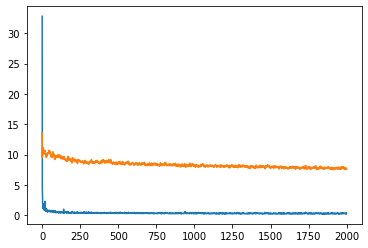

In [77]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [78]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = multi_channel_cnn_weather_model.predict([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6, train_X7, train_X8, train_X9])
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [79]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 6.7412803284973855


# Make predictions based on test set and get a root mean squared error 

In [80]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = multi_channel_cnn_weather_model.predict([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6, test_X7, test_X8, test_X9])
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [81]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 10.927291497704942


# Plot train labels along with train predictions

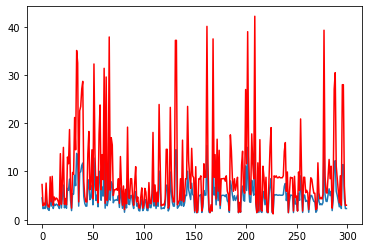

In [82]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

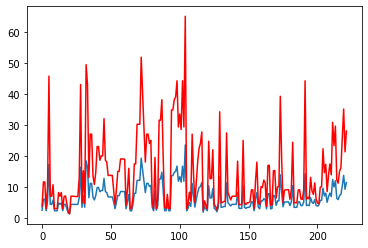

In [83]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with both the addition of weather data and normalization

In [84]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [85]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [86]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [87]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [88]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [89]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [90]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [91]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [92]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [93]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [94]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [95]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [96]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [97]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [98]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 9)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 9)
Shape of test_y: (222,)


# Perform train test split for dataset

# Must split multivariate time series into individual univariate time series to be fed into each channel in the model

In [99]:
train_X1 = []
train_X2 = []
train_X3 = []
train_X4 = []
train_X5 = []
train_X6 = []
train_X7 = []
train_X8 = []
train_X9 = []

for i in train_X:
    train_X1.append([x[0] for x in i])
    train_X2.append([x[1] for x in i])
    train_X3.append([x[2] for x in i])
    train_X4.append([x[3] for x in i])
    train_X5.append([x[4] for x in i])
    train_X6.append([x[5] for x in i])
    train_X7.append([x[6] for x in i])
    train_X8.append([x[7] for x in i])
    train_X9.append([x[8] for x in i])

In [100]:
np.array(train_X2).shape

train_X1 = np.array(train_X1)
train_X2 = np.array(train_X2)
train_X3 = np.array(train_X3)
train_X4 = np.array(train_X4)
train_X5 = np.array(train_X5)
train_X6 = np.array(train_X6)
train_X7 = np.array(train_X7)
train_X8 = np.array(train_X8)
train_X9 = np.array(train_X9)

In [101]:
test_X1 = []
test_X2 = []
test_X3 = []
test_X4 = []
test_X5 = []
test_X6 = []
test_X7 = []
test_X8 = []
test_X9 = []

for i in test_X:
    test_X1.append([x[0] for x in i])
    test_X2.append([x[1] for x in i])
    test_X3.append([x[2] for x in i])
    test_X4.append([x[3] for x in i])
    test_X5.append([x[4] for x in i])
    test_X6.append([x[5] for x in i])
    test_X7.append([x[6] for x in i])
    test_X8.append([x[7] for x in i])
    test_X9.append([x[8] for x in i])

In [102]:
np.array(train_X2).shape

test_X1 = np.array(test_X1)
test_X2 = np.array(test_X2)
test_X3 = np.array(test_X3)
test_X4 = np.array(test_X4)
test_X5 = np.array(test_X5)
test_X6 = np.array(test_X6)
test_X7 = np.array(test_X7)
test_X8 = np.array(test_X8)
test_X9 = np.array(test_X9)

# Build multi-channel cnn model

In [103]:
### Build a channel for each of the 6 variables

# channel 1
inputs1 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv1 = tf.keras.layers.Conv1D(filters=8, kernel_size=5, activation='relu')(inputs1)
drop1 = tf.keras.layers.Dropout(0.5)(conv1)
pool1 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1)
conv1_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool1)
drop1_2 = tf.keras.layers.Dropout(0.5)(conv1_2)
pool1_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1_2)
flat1 = tf.keras.layers.Flatten()(pool1_2)

# channel 2
inputs2 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv2 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs2)
drop2 = tf.keras.layers.Dropout(0.5)(conv2)
pool2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2)
conv2_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool2)
drop2_2 = tf.keras.layers.Dropout(0.5)(conv2_2)
pool2_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2_2)
flat2 = tf.keras.layers.Flatten()(pool2_2)

# channel 3
inputs3 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv3 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs3)
drop3 = tf.keras.layers.Dropout(0.5)(conv3)
pool3 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3)
conv3_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool3)
drop3_2 = tf.keras.layers.Dropout(0.5)(conv3_2)
pool3_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3_2)
flat3 = tf.keras.layers.Flatten()(pool3_2)

# channel 4
inputs4 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv4 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs4)
drop4 = tf.keras.layers.Dropout(0.5)(conv4)
pool4 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4)
conv4_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool4)
drop4_2 = tf.keras.layers.Dropout(0.5)(conv4_2)
pool4_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4_2)
flat4 = tf.keras.layers.Flatten()(pool4_2)

# channel 5
inputs5 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv5 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs5)
drop5 = tf.keras.layers.Dropout(0.5)(conv5)
pool5 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5)
conv5_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool5)
drop5_2 = tf.keras.layers.Dropout(0.5)(conv5_2)
pool5_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5_2)
flat5 = tf.keras.layers.Flatten()(pool5_2)

# channel 6
inputs6 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv6 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs6)
drop6 = tf.keras.layers.Dropout(0.5)(conv6)
pool6 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6)
conv6_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool6)
drop6_2 = tf.keras.layers.Dropout(0.5)(conv6_2)
pool6_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6_2)
flat6 = tf.keras.layers.Flatten()(pool6_2)

# channel 7
inputs7 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv7 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs7)
drop7 = tf.keras.layers.Dropout(0.5)(conv7)
pool7 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop7)
conv7_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool7)
drop7_2 = tf.keras.layers.Dropout(0.5)(conv7_2)
pool7_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop7_2)
flat7 = tf.keras.layers.Flatten()(pool7_2)

# channel 8
inputs8 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv8 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs8)
drop8 = tf.keras.layers.Dropout(0.5)(conv8)
pool8 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop8)
conv8_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool8)
drop8_2 = tf.keras.layers.Dropout(0.5)(conv8_2)
pool8_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop8_2)
flat8 = tf.keras.layers.Flatten()(pool8_2)

# channel 9
inputs9 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv9 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs9)
drop9 = tf.keras.layers.Dropout(0.5)(conv9)
pool9 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop9)
conv9_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool9)
drop9_2 = tf.keras.layers.Dropout(0.5)(conv9_2)
pool9_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop9_2)
flat9 = tf.keras.layers.Flatten()(pool9_2)

# merge
merged = tf.keras.layers.concatenate([flat1, flat2, flat3, flat4, flat5, flat6, flat7, flat8, flat9])

# dense output layers
dense1 = tf.keras.layers.Dense(units=732, activation='relu')(merged)
output = tf.keras.layers.Dense(units=1)(dense1)

multi_channel_cnn_both_model = tf.keras.Model(inputs=[inputs1, inputs2, inputs3, inputs4, inputs5, inputs6, inputs7, inputs8,
                                                     inputs9], outputs=output)

print(multi_channel_cnn_both_model.summary())

Model: "functional_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_22 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_23 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_24 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_25 (InputLayer)           [(None, 21, 1)]      0                                            
_______________________________________________________________________________________

# Compile model

In [104]:
from tensorflow import keras

multi_channel_cnn_both_model.compile(loss='mae', optimizer='adam')

# Train model

In [105]:
history = multi_channel_cnn_both_model.fit([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6, train_X7, train_X8, train_X9], train_y, epochs=2000, batch_size=32, 
                                      validation_data=([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6, test_X7, test_X8, test_X9], test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 0s - loss: 0.1647 - val_loss: 0.1481
Epoch 2/2000
10/10 - 0s - loss: 0.1350 - val_loss: 0.1360
Epoch 3/2000
10/10 - 0s - loss: 0.1326 - val_loss: 0.1352
Epoch 4/2000
10/10 - 0s - loss: 0.1282 - val_loss: 0.1354
Epoch 5/2000
10/10 - 0s - loss: 0.1264 - val_loss: 0.1355
Epoch 6/2000
10/10 - 0s - loss: 0.1232 - val_loss: 0.1359
Epoch 7/2000
10/10 - 0s - loss: 0.1224 - val_loss: 0.1372
Epoch 8/2000
10/10 - 0s - loss: 0.1246 - val_loss: 0.1357
Epoch 9/2000
10/10 - 0s - loss: 0.1211 - val_loss: 0.1358
Epoch 10/2000
10/10 - 0s - loss: 0.1163 - val_loss: 0.1343
Epoch 11/2000
10/10 - 0s - loss: 0.1176 - val_loss: 0.1337
Epoch 12/2000
10/10 - 0s - loss: 0.1184 - val_loss: 0.1338
Epoch 13/2000
10/10 - 0s - loss: 0.1177 - val_loss: 0.1354
Epoch 14/2000
10/10 - 0s - loss: 0.1180 - val_loss: 0.1323
Epoch 15/2000
10/10 - 0s - loss: 0.1192 - val_loss: 0.1328
Epoch 16/2000
10/10 - 0s - loss: 0.1120 - val_loss: 0.1319
Epoch 17/2000
10/10 - 0s - loss: 0.1101 - val_loss: 0.1324
Epoch 

Epoch 140/2000
10/10 - 0s - loss: 0.0812 - val_loss: 0.1366
Epoch 141/2000
10/10 - 0s - loss: 0.0819 - val_loss: 0.1391
Epoch 142/2000
10/10 - 0s - loss: 0.0884 - val_loss: 0.1403
Epoch 143/2000
10/10 - 0s - loss: 0.0843 - val_loss: 0.1369
Epoch 144/2000
10/10 - 0s - loss: 0.0827 - val_loss: 0.1353
Epoch 145/2000
10/10 - 0s - loss: 0.0845 - val_loss: 0.1376
Epoch 146/2000
10/10 - 0s - loss: 0.0812 - val_loss: 0.1363
Epoch 147/2000
10/10 - 0s - loss: 0.0826 - val_loss: 0.1372
Epoch 148/2000
10/10 - 0s - loss: 0.0811 - val_loss: 0.1379
Epoch 149/2000
10/10 - 0s - loss: 0.0869 - val_loss: 0.1375
Epoch 150/2000
10/10 - 0s - loss: 0.0843 - val_loss: 0.1385
Epoch 151/2000
10/10 - 0s - loss: 0.0827 - val_loss: 0.1370
Epoch 152/2000
10/10 - 0s - loss: 0.0839 - val_loss: 0.1377
Epoch 153/2000
10/10 - 0s - loss: 0.0834 - val_loss: 0.1380
Epoch 154/2000
10/10 - 0s - loss: 0.0831 - val_loss: 0.1383
Epoch 155/2000
10/10 - 0s - loss: 0.0825 - val_loss: 0.1360
Epoch 156/2000
10/10 - 0s - loss: 0.0811

Epoch 277/2000
10/10 - 0s - loss: 0.0733 - val_loss: 0.1368
Epoch 278/2000
10/10 - 0s - loss: 0.0683 - val_loss: 0.1340
Epoch 279/2000
10/10 - 0s - loss: 0.0767 - val_loss: 0.1326
Epoch 280/2000
10/10 - 0s - loss: 0.0712 - val_loss: 0.1309
Epoch 281/2000
10/10 - 0s - loss: 0.0738 - val_loss: 0.1328
Epoch 282/2000
10/10 - 0s - loss: 0.0730 - val_loss: 0.1330
Epoch 283/2000
10/10 - 0s - loss: 0.0774 - val_loss: 0.1298
Epoch 284/2000
10/10 - 0s - loss: 0.0708 - val_loss: 0.1296
Epoch 285/2000
10/10 - 0s - loss: 0.0762 - val_loss: 0.1319
Epoch 286/2000
10/10 - 0s - loss: 0.0764 - val_loss: 0.1314
Epoch 287/2000
10/10 - 0s - loss: 0.0762 - val_loss: 0.1326
Epoch 288/2000
10/10 - 0s - loss: 0.0718 - val_loss: 0.1325
Epoch 289/2000
10/10 - 0s - loss: 0.0750 - val_loss: 0.1297
Epoch 290/2000
10/10 - 0s - loss: 0.0742 - val_loss: 0.1311
Epoch 291/2000
10/10 - 0s - loss: 0.0715 - val_loss: 0.1294
Epoch 292/2000
10/10 - 0s - loss: 0.0767 - val_loss: 0.1295
Epoch 293/2000
10/10 - 0s - loss: 0.0751

Epoch 414/2000
10/10 - 0s - loss: 0.0633 - val_loss: 0.1317
Epoch 415/2000
10/10 - 0s - loss: 0.0710 - val_loss: 0.1311
Epoch 416/2000
10/10 - 0s - loss: 0.0717 - val_loss: 0.1293
Epoch 417/2000
10/10 - 0s - loss: 0.0694 - val_loss: 0.1290
Epoch 418/2000
10/10 - 0s - loss: 0.0685 - val_loss: 0.1281
Epoch 419/2000
10/10 - 0s - loss: 0.0705 - val_loss: 0.1294
Epoch 420/2000
10/10 - 0s - loss: 0.0712 - val_loss: 0.1275
Epoch 421/2000
10/10 - 0s - loss: 0.0690 - val_loss: 0.1289
Epoch 422/2000
10/10 - 0s - loss: 0.0736 - val_loss: 0.1295
Epoch 423/2000
10/10 - 0s - loss: 0.0656 - val_loss: 0.1299
Epoch 424/2000
10/10 - 0s - loss: 0.0634 - val_loss: 0.1303
Epoch 425/2000
10/10 - 0s - loss: 0.0706 - val_loss: 0.1303
Epoch 426/2000
10/10 - 0s - loss: 0.0666 - val_loss: 0.1323
Epoch 427/2000
10/10 - 0s - loss: 0.0742 - val_loss: 0.1308
Epoch 428/2000
10/10 - 0s - loss: 0.0699 - val_loss: 0.1314
Epoch 429/2000
10/10 - 0s - loss: 0.0667 - val_loss: 0.1303
Epoch 430/2000
10/10 - 0s - loss: 0.0665

Epoch 551/2000
10/10 - 0s - loss: 0.0672 - val_loss: 0.1319
Epoch 552/2000
10/10 - 0s - loss: 0.0643 - val_loss: 0.1341
Epoch 553/2000
10/10 - 0s - loss: 0.0659 - val_loss: 0.1322
Epoch 554/2000
10/10 - 0s - loss: 0.0628 - val_loss: 0.1333
Epoch 555/2000
10/10 - 0s - loss: 0.0680 - val_loss: 0.1345
Epoch 556/2000
10/10 - 0s - loss: 0.0624 - val_loss: 0.1331
Epoch 557/2000
10/10 - 0s - loss: 0.0654 - val_loss: 0.1343
Epoch 558/2000
10/10 - 0s - loss: 0.0640 - val_loss: 0.1332
Epoch 559/2000
10/10 - 0s - loss: 0.0638 - val_loss: 0.1334
Epoch 560/2000
10/10 - 0s - loss: 0.0659 - val_loss: 0.1323
Epoch 561/2000
10/10 - 0s - loss: 0.0675 - val_loss: 0.1330
Epoch 562/2000
10/10 - 0s - loss: 0.0646 - val_loss: 0.1322
Epoch 563/2000
10/10 - 0s - loss: 0.0637 - val_loss: 0.1337
Epoch 564/2000
10/10 - 0s - loss: 0.0633 - val_loss: 0.1348
Epoch 565/2000
10/10 - 0s - loss: 0.0668 - val_loss: 0.1337
Epoch 566/2000
10/10 - 0s - loss: 0.0640 - val_loss: 0.1329
Epoch 567/2000
10/10 - 0s - loss: 0.0637

Epoch 688/2000
10/10 - 0s - loss: 0.0564 - val_loss: 0.1293
Epoch 689/2000
10/10 - 0s - loss: 0.0615 - val_loss: 0.1274
Epoch 690/2000
10/10 - 0s - loss: 0.0665 - val_loss: 0.1283
Epoch 691/2000
10/10 - 0s - loss: 0.0651 - val_loss: 0.1273
Epoch 692/2000
10/10 - 0s - loss: 0.0614 - val_loss: 0.1286
Epoch 693/2000
10/10 - 0s - loss: 0.0645 - val_loss: 0.1289
Epoch 694/2000
10/10 - 0s - loss: 0.0609 - val_loss: 0.1311
Epoch 695/2000
10/10 - 0s - loss: 0.0604 - val_loss: 0.1292
Epoch 696/2000
10/10 - 0s - loss: 0.0623 - val_loss: 0.1298
Epoch 697/2000
10/10 - 0s - loss: 0.0592 - val_loss: 0.1301
Epoch 698/2000
10/10 - 0s - loss: 0.0629 - val_loss: 0.1296
Epoch 699/2000
10/10 - 0s - loss: 0.0595 - val_loss: 0.1286
Epoch 700/2000
10/10 - 0s - loss: 0.0636 - val_loss: 0.1295
Epoch 701/2000
10/10 - 0s - loss: 0.0606 - val_loss: 0.1295
Epoch 702/2000
10/10 - 0s - loss: 0.0603 - val_loss: 0.1313
Epoch 703/2000
10/10 - 0s - loss: 0.0600 - val_loss: 0.1310
Epoch 704/2000
10/10 - 0s - loss: 0.0655

Epoch 825/2000
10/10 - 0s - loss: 0.0629 - val_loss: 0.1305
Epoch 826/2000
10/10 - 0s - loss: 0.0583 - val_loss: 0.1306
Epoch 827/2000
10/10 - 0s - loss: 0.0596 - val_loss: 0.1312
Epoch 828/2000
10/10 - 0s - loss: 0.0616 - val_loss: 0.1326
Epoch 829/2000
10/10 - 0s - loss: 0.0618 - val_loss: 0.1329
Epoch 830/2000
10/10 - 0s - loss: 0.0598 - val_loss: 0.1334
Epoch 831/2000
10/10 - 0s - loss: 0.0623 - val_loss: 0.1302
Epoch 832/2000
10/10 - 0s - loss: 0.0523 - val_loss: 0.1300
Epoch 833/2000
10/10 - 0s - loss: 0.0566 - val_loss: 0.1327
Epoch 834/2000
10/10 - 0s - loss: 0.0568 - val_loss: 0.1342
Epoch 835/2000
10/10 - 0s - loss: 0.0618 - val_loss: 0.1345
Epoch 836/2000
10/10 - 0s - loss: 0.0637 - val_loss: 0.1346
Epoch 837/2000
10/10 - 0s - loss: 0.0549 - val_loss: 0.1337
Epoch 838/2000
10/10 - 0s - loss: 0.0547 - val_loss: 0.1325
Epoch 839/2000
10/10 - 0s - loss: 0.0583 - val_loss: 0.1330
Epoch 840/2000
10/10 - 0s - loss: 0.0666 - val_loss: 0.1320
Epoch 841/2000
10/10 - 0s - loss: 0.0633

Epoch 962/2000
10/10 - 0s - loss: 0.0608 - val_loss: 0.1339
Epoch 963/2000
10/10 - 0s - loss: 0.0570 - val_loss: 0.1348
Epoch 964/2000
10/10 - 0s - loss: 0.0554 - val_loss: 0.1350
Epoch 965/2000
10/10 - 0s - loss: 0.0601 - val_loss: 0.1329
Epoch 966/2000
10/10 - 0s - loss: 0.0549 - val_loss: 0.1330
Epoch 967/2000
10/10 - 0s - loss: 0.0584 - val_loss: 0.1339
Epoch 968/2000
10/10 - 0s - loss: 0.0617 - val_loss: 0.1327
Epoch 969/2000
10/10 - 0s - loss: 0.0590 - val_loss: 0.1356
Epoch 970/2000
10/10 - 0s - loss: 0.0617 - val_loss: 0.1352
Epoch 971/2000
10/10 - 0s - loss: 0.0561 - val_loss: 0.1331
Epoch 972/2000
10/10 - 0s - loss: 0.0619 - val_loss: 0.1324
Epoch 973/2000
10/10 - 0s - loss: 0.0570 - val_loss: 0.1331
Epoch 974/2000
10/10 - 0s - loss: 0.0571 - val_loss: 0.1352
Epoch 975/2000
10/10 - 0s - loss: 0.0562 - val_loss: 0.1332
Epoch 976/2000
10/10 - 0s - loss: 0.0552 - val_loss: 0.1325
Epoch 977/2000
10/10 - 0s - loss: 0.0581 - val_loss: 0.1309
Epoch 978/2000
10/10 - 0s - loss: 0.0648

Epoch 1097/2000
10/10 - 0s - loss: 0.0547 - val_loss: 0.1327
Epoch 1098/2000
10/10 - 0s - loss: 0.0556 - val_loss: 0.1323
Epoch 1099/2000
10/10 - 0s - loss: 0.0581 - val_loss: 0.1336
Epoch 1100/2000
10/10 - 0s - loss: 0.0546 - val_loss: 0.1326
Epoch 1101/2000
10/10 - 0s - loss: 0.0557 - val_loss: 0.1325
Epoch 1102/2000
10/10 - 0s - loss: 0.0581 - val_loss: 0.1320
Epoch 1103/2000
10/10 - 0s - loss: 0.0570 - val_loss: 0.1321
Epoch 1104/2000
10/10 - 0s - loss: 0.0562 - val_loss: 0.1334
Epoch 1105/2000
10/10 - 0s - loss: 0.0617 - val_loss: 0.1343
Epoch 1106/2000
10/10 - 0s - loss: 0.0614 - val_loss: 0.1350
Epoch 1107/2000
10/10 - 0s - loss: 0.0582 - val_loss: 0.1342
Epoch 1108/2000
10/10 - 0s - loss: 0.0588 - val_loss: 0.1337
Epoch 1109/2000
10/10 - 0s - loss: 0.0545 - val_loss: 0.1356
Epoch 1110/2000
10/10 - 0s - loss: 0.0509 - val_loss: 0.1347
Epoch 1111/2000
10/10 - 0s - loss: 0.0551 - val_loss: 0.1327
Epoch 1112/2000
10/10 - 0s - loss: 0.0511 - val_loss: 0.1341
Epoch 1113/2000
10/10 - 

Epoch 1232/2000
10/10 - 0s - loss: 0.0530 - val_loss: 0.1334
Epoch 1233/2000
10/10 - 0s - loss: 0.0542 - val_loss: 0.1331
Epoch 1234/2000
10/10 - 0s - loss: 0.0576 - val_loss: 0.1328
Epoch 1235/2000
10/10 - 0s - loss: 0.0526 - val_loss: 0.1327
Epoch 1236/2000
10/10 - 0s - loss: 0.0546 - val_loss: 0.1328
Epoch 1237/2000
10/10 - 0s - loss: 0.0574 - val_loss: 0.1328
Epoch 1238/2000
10/10 - 0s - loss: 0.0521 - val_loss: 0.1315
Epoch 1239/2000
10/10 - 0s - loss: 0.0513 - val_loss: 0.1324
Epoch 1240/2000
10/10 - 0s - loss: 0.0541 - val_loss: 0.1323
Epoch 1241/2000
10/10 - 0s - loss: 0.0563 - val_loss: 0.1322
Epoch 1242/2000
10/10 - 0s - loss: 0.0528 - val_loss: 0.1326
Epoch 1243/2000
10/10 - 0s - loss: 0.0549 - val_loss: 0.1327
Epoch 1244/2000
10/10 - 0s - loss: 0.0536 - val_loss: 0.1333
Epoch 1245/2000
10/10 - 0s - loss: 0.0607 - val_loss: 0.1321
Epoch 1246/2000
10/10 - 0s - loss: 0.0551 - val_loss: 0.1329
Epoch 1247/2000
10/10 - 0s - loss: 0.0519 - val_loss: 0.1330
Epoch 1248/2000
10/10 - 

Epoch 1367/2000
10/10 - 0s - loss: 0.0557 - val_loss: 0.1352
Epoch 1368/2000
10/10 - 0s - loss: 0.0572 - val_loss: 0.1360
Epoch 1369/2000
10/10 - 0s - loss: 0.0531 - val_loss: 0.1354
Epoch 1370/2000
10/10 - 0s - loss: 0.0535 - val_loss: 0.1345
Epoch 1371/2000
10/10 - 0s - loss: 0.0502 - val_loss: 0.1338
Epoch 1372/2000
10/10 - 0s - loss: 0.0550 - val_loss: 0.1341
Epoch 1373/2000
10/10 - 0s - loss: 0.0515 - val_loss: 0.1339
Epoch 1374/2000
10/10 - 0s - loss: 0.0526 - val_loss: 0.1346
Epoch 1375/2000
10/10 - 0s - loss: 0.0535 - val_loss: 0.1340
Epoch 1376/2000
10/10 - 0s - loss: 0.0512 - val_loss: 0.1344
Epoch 1377/2000
10/10 - 0s - loss: 0.0492 - val_loss: 0.1345
Epoch 1378/2000
10/10 - 0s - loss: 0.0476 - val_loss: 0.1328
Epoch 1379/2000
10/10 - 0s - loss: 0.0552 - val_loss: 0.1318
Epoch 1380/2000
10/10 - 0s - loss: 0.0539 - val_loss: 0.1336
Epoch 1381/2000
10/10 - 0s - loss: 0.0496 - val_loss: 0.1348
Epoch 1382/2000
10/10 - 0s - loss: 0.0510 - val_loss: 0.1346
Epoch 1383/2000
10/10 - 

Epoch 1502/2000
10/10 - 0s - loss: 0.0558 - val_loss: 0.1369
Epoch 1503/2000
10/10 - 0s - loss: 0.0516 - val_loss: 0.1354
Epoch 1504/2000
10/10 - 0s - loss: 0.0519 - val_loss: 0.1363
Epoch 1505/2000
10/10 - 0s - loss: 0.0566 - val_loss: 0.1355
Epoch 1506/2000
10/10 - 0s - loss: 0.0561 - val_loss: 0.1345
Epoch 1507/2000
10/10 - 0s - loss: 0.0543 - val_loss: 0.1350
Epoch 1508/2000
10/10 - 0s - loss: 0.0506 - val_loss: 0.1335
Epoch 1509/2000
10/10 - 0s - loss: 0.0529 - val_loss: 0.1341
Epoch 1510/2000
10/10 - 0s - loss: 0.0499 - val_loss: 0.1344
Epoch 1511/2000
10/10 - 0s - loss: 0.0561 - val_loss: 0.1344
Epoch 1512/2000
10/10 - 0s - loss: 0.0580 - val_loss: 0.1329
Epoch 1513/2000
10/10 - 0s - loss: 0.0501 - val_loss: 0.1341
Epoch 1514/2000
10/10 - 0s - loss: 0.0520 - val_loss: 0.1345
Epoch 1515/2000
10/10 - 0s - loss: 0.0526 - val_loss: 0.1347
Epoch 1516/2000
10/10 - 0s - loss: 0.0535 - val_loss: 0.1342
Epoch 1517/2000
10/10 - 0s - loss: 0.0493 - val_loss: 0.1347
Epoch 1518/2000
10/10 - 

Epoch 1637/2000
10/10 - 0s - loss: 0.0529 - val_loss: 0.1360
Epoch 1638/2000
10/10 - 0s - loss: 0.0516 - val_loss: 0.1364
Epoch 1639/2000
10/10 - 0s - loss: 0.0538 - val_loss: 0.1377
Epoch 1640/2000
10/10 - 0s - loss: 0.0452 - val_loss: 0.1368
Epoch 1641/2000
10/10 - 0s - loss: 0.0548 - val_loss: 0.1374
Epoch 1642/2000
10/10 - 0s - loss: 0.0547 - val_loss: 0.1355
Epoch 1643/2000
10/10 - 0s - loss: 0.0522 - val_loss: 0.1340
Epoch 1644/2000
10/10 - 0s - loss: 0.0513 - val_loss: 0.1354
Epoch 1645/2000
10/10 - 0s - loss: 0.0561 - val_loss: 0.1367
Epoch 1646/2000
10/10 - 0s - loss: 0.0486 - val_loss: 0.1351
Epoch 1647/2000
10/10 - 0s - loss: 0.0532 - val_loss: 0.1352
Epoch 1648/2000
10/10 - 0s - loss: 0.0543 - val_loss: 0.1349
Epoch 1649/2000
10/10 - 0s - loss: 0.0498 - val_loss: 0.1359
Epoch 1650/2000
10/10 - 0s - loss: 0.0558 - val_loss: 0.1347
Epoch 1651/2000
10/10 - 0s - loss: 0.0499 - val_loss: 0.1352
Epoch 1652/2000
10/10 - 0s - loss: 0.0573 - val_loss: 0.1363
Epoch 1653/2000
10/10 - 

Epoch 1772/2000
10/10 - 0s - loss: 0.0497 - val_loss: 0.1365
Epoch 1773/2000
10/10 - 0s - loss: 0.0518 - val_loss: 0.1385
Epoch 1774/2000
10/10 - 0s - loss: 0.0534 - val_loss: 0.1399
Epoch 1775/2000
10/10 - 0s - loss: 0.0576 - val_loss: 0.1379
Epoch 1776/2000
10/10 - 0s - loss: 0.0512 - val_loss: 0.1366
Epoch 1777/2000
10/10 - 0s - loss: 0.0445 - val_loss: 0.1359
Epoch 1778/2000
10/10 - 0s - loss: 0.0507 - val_loss: 0.1354
Epoch 1779/2000
10/10 - 0s - loss: 0.0490 - val_loss: 0.1365
Epoch 1780/2000
10/10 - 0s - loss: 0.0542 - val_loss: 0.1371
Epoch 1781/2000
10/10 - 0s - loss: 0.0516 - val_loss: 0.1359
Epoch 1782/2000
10/10 - 0s - loss: 0.0516 - val_loss: 0.1350
Epoch 1783/2000
10/10 - 0s - loss: 0.0553 - val_loss: 0.1355
Epoch 1784/2000
10/10 - 0s - loss: 0.0547 - val_loss: 0.1358
Epoch 1785/2000
10/10 - 0s - loss: 0.0520 - val_loss: 0.1355
Epoch 1786/2000
10/10 - 0s - loss: 0.0487 - val_loss: 0.1356
Epoch 1787/2000
10/10 - 0s - loss: 0.0526 - val_loss: 0.1346
Epoch 1788/2000
10/10 - 

Epoch 1907/2000
10/10 - 0s - loss: 0.0521 - val_loss: 0.1358
Epoch 1908/2000
10/10 - 0s - loss: 0.0513 - val_loss: 0.1362
Epoch 1909/2000
10/10 - 0s - loss: 0.0482 - val_loss: 0.1361
Epoch 1910/2000
10/10 - 0s - loss: 0.0528 - val_loss: 0.1353
Epoch 1911/2000
10/10 - 0s - loss: 0.0521 - val_loss: 0.1335
Epoch 1912/2000
10/10 - 0s - loss: 0.0469 - val_loss: 0.1345
Epoch 1913/2000
10/10 - 0s - loss: 0.0492 - val_loss: 0.1350
Epoch 1914/2000
10/10 - 0s - loss: 0.0593 - val_loss: 0.1362
Epoch 1915/2000
10/10 - 0s - loss: 0.0507 - val_loss: 0.1362
Epoch 1916/2000
10/10 - 0s - loss: 0.0470 - val_loss: 0.1359
Epoch 1917/2000
10/10 - 0s - loss: 0.0504 - val_loss: 0.1348
Epoch 1918/2000
10/10 - 0s - loss: 0.0538 - val_loss: 0.1343
Epoch 1919/2000
10/10 - 0s - loss: 0.0544 - val_loss: 0.1339
Epoch 1920/2000
10/10 - 0s - loss: 0.0504 - val_loss: 0.1350
Epoch 1921/2000
10/10 - 0s - loss: 0.0504 - val_loss: 0.1345
Epoch 1922/2000
10/10 - 0s - loss: 0.0516 - val_loss: 0.1349
Epoch 1923/2000
10/10 - 

# Plot model loss and validation loss

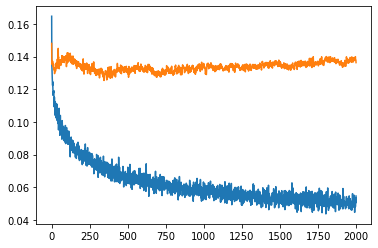

In [106]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [107]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = multi_channel_cnn_both_model.predict([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6, train_X7, train_X8, train_X9])
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [108]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.09609484706630494


# Make predictions based on test set and get a root mean squared error 

In [109]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = multi_channel_cnn_both_model.predict([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6, test_X7, test_X8, test_X9])
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [110]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.2048885527176827


# Plot train labels along with train predictions

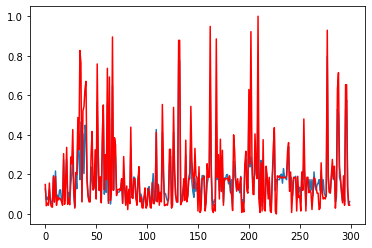

In [111]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

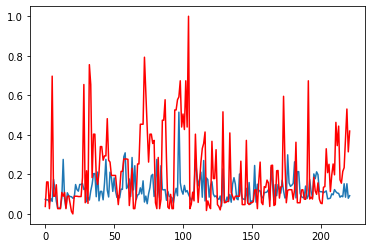

In [112]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()